In [1]:
import os
import numpy as np
import scanpy as sc
import anndata as ad
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import pickle
plt.rcParams['figure.figsize']=(5, 5)
plt.rcParams['figure.dpi'] = 200
sc.settings.verbosity = 3
sc.settings.figdir = '../figures/'
sc.logging.print_versions()
#results_file = './write/results.h5ad'


%load_ext autoreload
%autoreload 2 

scanpy==1.4.4 anndata==0.6.22 umap==0.3.10 numpy==1.19.1 scipy==1.2.1 pandas==0.25.3 scikit-learn==0.22 statsmodels==0.11.1


In [2]:
import rpy2.rinterface_lib.callbacks
import logging
import warnings
from rpy2.robjects import pandas2ri
import anndata2ri


# Ignore R warning messages
#Note: this can be commented out to get more verbose R output
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

# Automatically convert rpy2 outputs to pandas dataframes
pandas2ri.activate()
anndata2ri.activate()
%load_ext rpy2.ipython

ModuleNotFoundError: No module named 'rpy2.rinterface_lib'

In [3]:
%%R
# Load all the R libraries we will be using in the notebook
library(scran)
library(RColorBrewer)
library(slingshot)
library(monocle)
#library(gam)
#library(clusterExperiment)
library(ggplot2)
#library(plyr)
library(MAST)

In [4]:
adata

AnnData object with n_obs × n_vars = 4878 × 13997
    obs: 'batch', 'condition', 'tissue', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'doublet_scores', 'predicted_doublets', 'size_factors', 'S_score', 'G2M_score', 'phase', 'louvain_r1', 'louvain_r0.5'
    var: 'gene_id', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'condition_colors', 'dendrogram_louvain_r1', 'diffmap_evals', 'draw_graph', 'louvain', 'louvain_r0.5_colors', 'louvain_r1_colors', 'neighbors', 'pca', 'phase_colors', 'rank_genes_r0.5', 'rank_genes_r1'
    obsm: 'X_diffmap', 'X_draw_graph_fa', 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [3]:
adata_ref = sc.read('../../data/processed/adrenal_renamed_latest.h5ad')

# Dataloading

In [2]:
data_dir = './../../data/raw/CLT_A'

In [3]:
adatas = []

data_file = './../../data/raw/CLT_A1/filtered_gene_bc_matrices/mm10/matrix.mtx'
barcode_file = './../../data/raw/CLT_A1/filtered_gene_bc_matrices/mm10/barcodes.tsv'
gene_file = './../../data/raw/CLT_A1/filtered_gene_bc_matrices/mm10/genes.tsv'

adata = sc.read(data_file)
adata = adata.transpose()
adata.X = adata.X.toarray()

barcodes = pd.read_csv(barcode_file, header=None, sep='\t')
genes = pd.read_csv(gene_file, header=None, sep='\t')

#Annotate data
barcodes.rename(columns={0:'barcode'}, inplace=True)
barcodes.set_index('barcode', inplace=True)
adata.obs = barcodes
adata.obs['tissue'] = 'Adrenal'
adata.obs['condition'] = 'Control'
genes.rename(columns={0:'gene_id', 1:'gene_symbol'}, inplace=True)
genes.set_index('gene_symbol', inplace=True)
adata.var = genes
adata.var_names_make_unique()
adatas.append(adata)

##############################################################################################
data_file = './../../data/raw/CSD_A1/filtered_gene_bc_matrices/mm10/matrix.mtx'
barcode_file = './../../data/raw/CSD_A1/filtered_gene_bc_matrices/mm10/barcodes.tsv'
gene_file = './../../data/raw/CSD_A1/filtered_gene_bc_matrices/mm10/genes.tsv'

adata = sc.read(data_file)
adata = adata.transpose()
adata.X = adata.X.toarray()

barcodes = pd.read_csv(barcode_file, header=None, sep='\t')
genes = pd.read_csv(gene_file, header=None, sep='\t')

#Annotate data
barcodes.rename(columns={0:'barcode'}, inplace=True)
barcodes.set_index('barcode', inplace=True)
adata.obs = barcodes
adata.obs['tissue'] = 'Adrenal'
adata.obs['condition'] = 'Stress'
genes.rename(columns={0:'gene_id', 1:'gene_symbol'}, inplace=True)
genes.set_index('gene_symbol', inplace=True)
adata.var = genes
adata.var_names_make_unique()
adatas.append(adata)
print(adata, adatas[0])
adata = adatas[0].concatenate(adatas[1:])
print(adata)
#adata.var['gene_id'] = adata.var['gene_id-1']
#adata.var.drop(columns = ['gene_id-1', 'gene_id-0'], inplace=True)
#adata.obs.drop(columns=['sample_id'], inplace=True)
#adata.obs_names = [c.split("-")[0] for c in adata.obs_names]
#adata.obs_names_make_unique(join='_')

del adatas

--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
AnnData object with n_obs × n_vars = 3183 × 27998 
    obs: 'tissue', 'condition'
    var: 'gene_id' AnnData object with n_obs × n_vars = 2330 × 27998 
    obs: 'tissue', 'condition'
    var: 'gene_id'
AnnData object with n_obs × n_vars = 5513 × 27998 
    obs: 'batch', 'condition', 'tissue'
    var: 'gene_id'


In [4]:
print(adata.obs['condition'].value_counts())
print('')

Stress     3183
Control    2330
Name: condition, dtype: int64



# QC

In [5]:
# Quality control - calculate QC covariates
adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
adata.obs['n_genes'] = (adata.X > 0).sum(1)

mt_gene_mask = [gene.startswith('mt-') for gene in adata.var_names]
adata.obs['mt_frac'] = adata.X[:, mt_gene_mask].sum(1)/adata.obs['n_counts']

... storing 'condition' as categorical
... storing 'tissue' as categorical


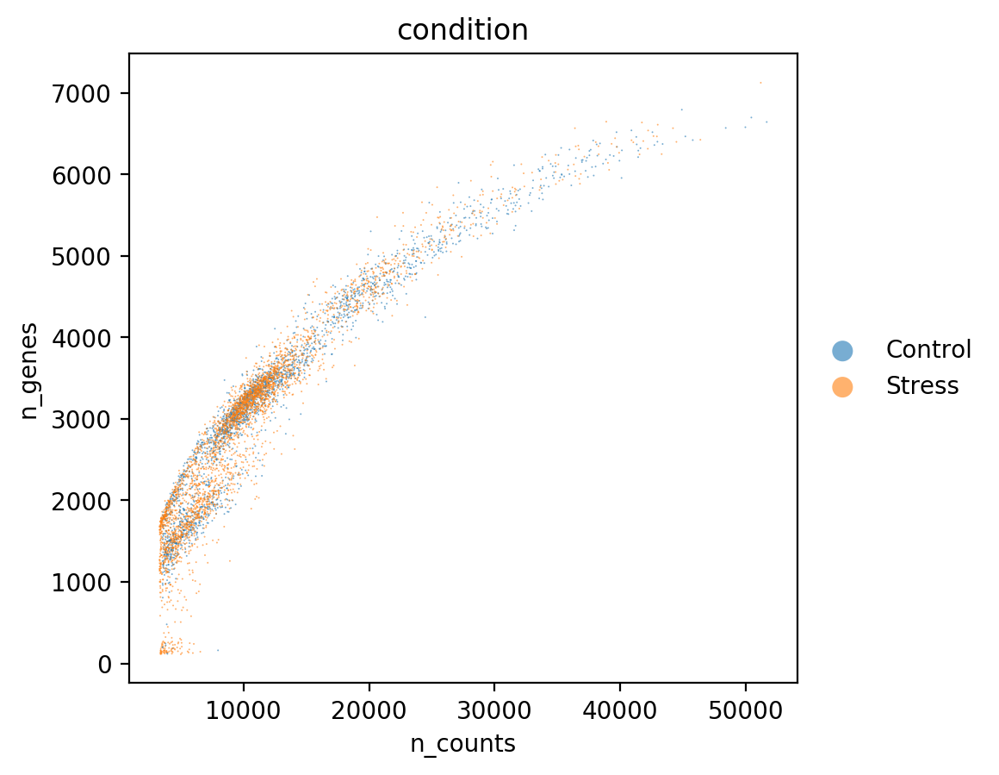

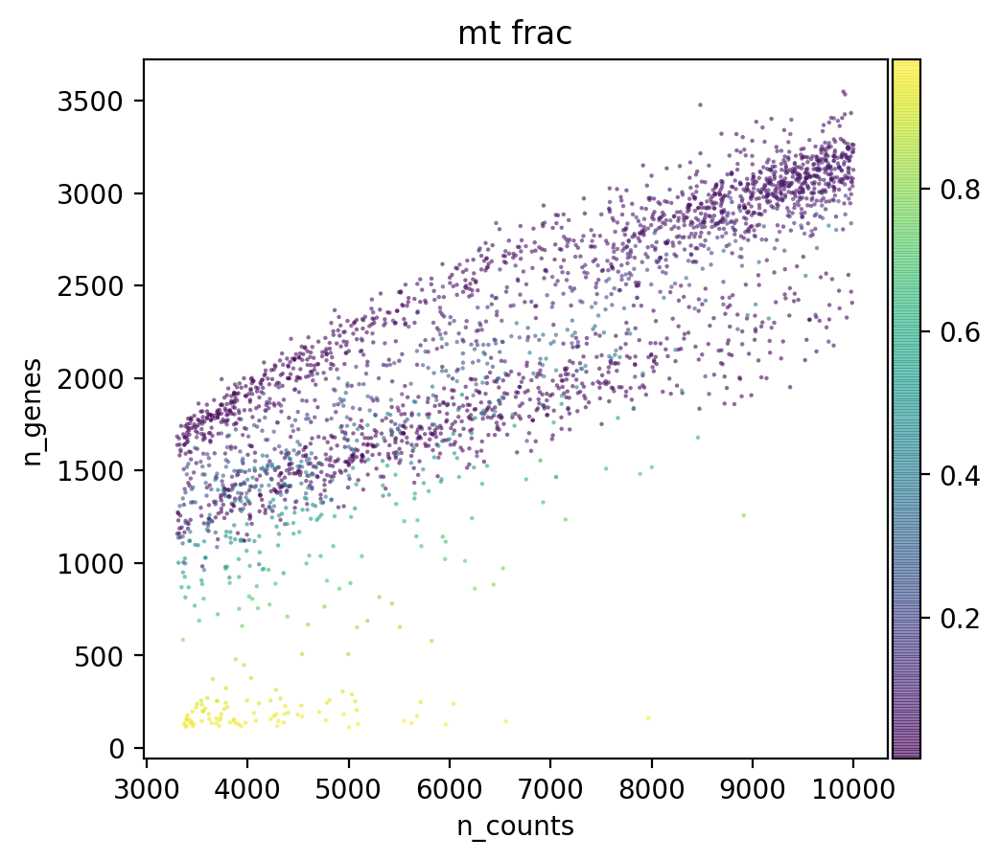

In [6]:
#Data quality summary plots
#plt.rcParams['figure.figsize'] = (10, 10)
p1 = sc.pl.scatter(adata, 'n_counts', 'n_genes', size=2, color='condition', alpha=0.6)
p2 = sc.pl.scatter(adata[adata.obs['n_counts']<10000], 'n_counts', 'n_genes', color='mt_frac', size=10, alpha=0.6)

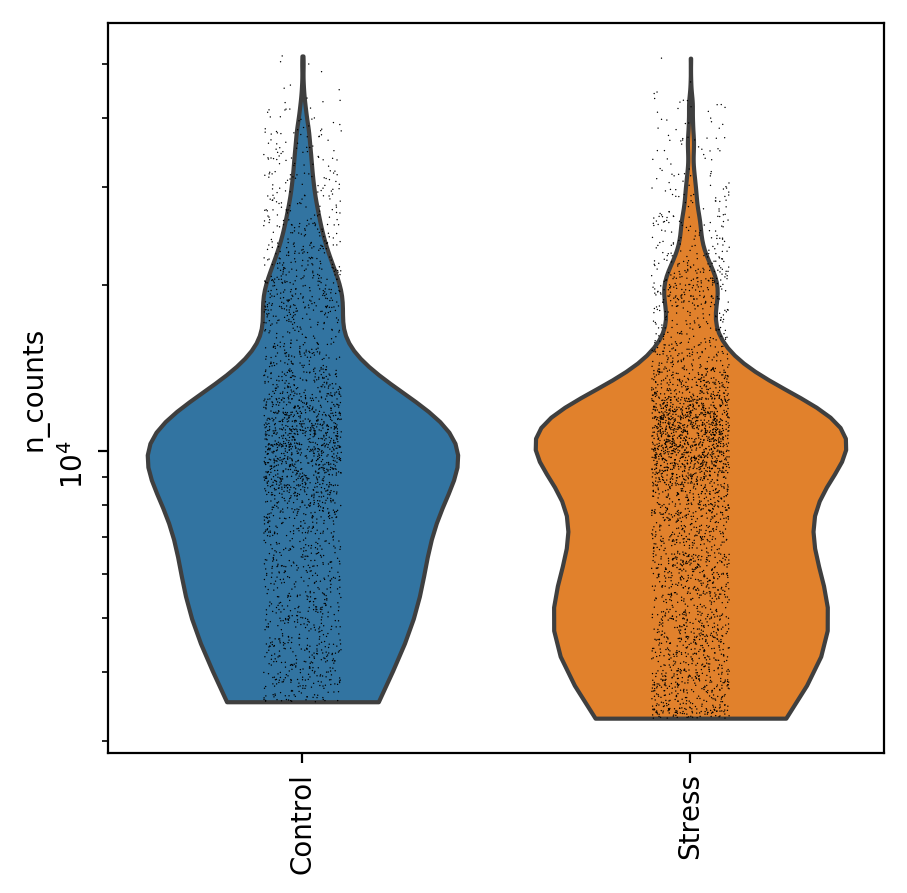

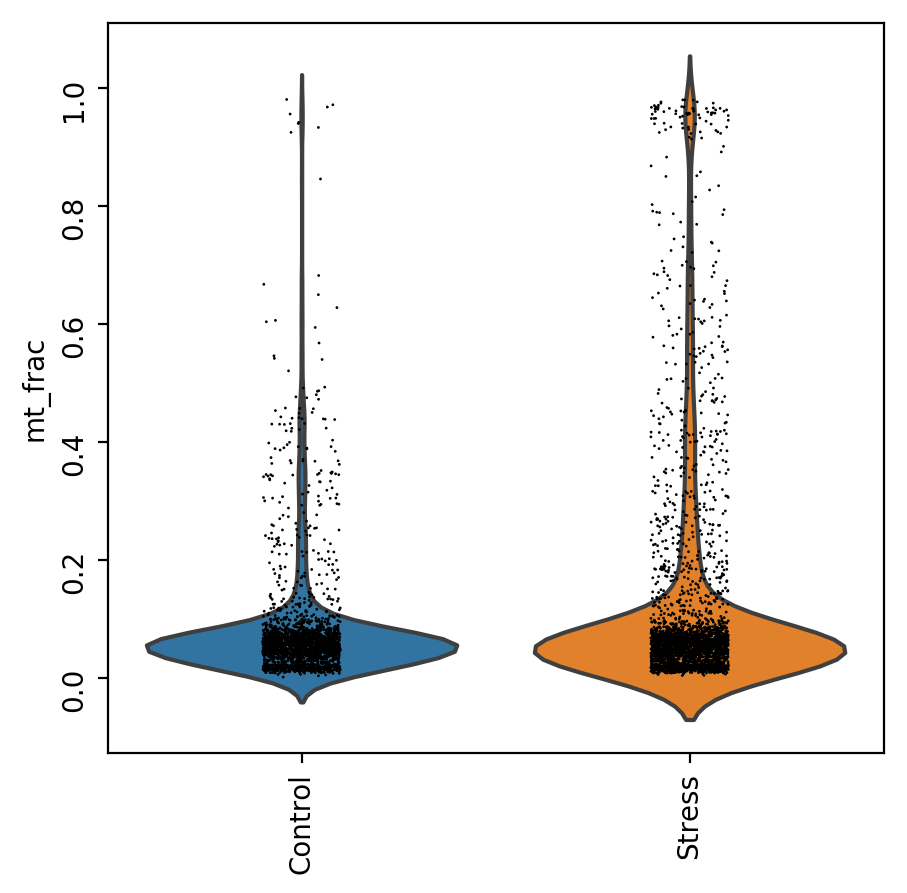

In [7]:
# Quality control - plot QC metrics
#Sample quality plots
t1 = sc.pl.violin(adata, 'n_counts', groupby='condition', size=0.5, log=True, cut=0, rotation=90)
t4 = sc.pl.violin(adata, 'mt_frac', groupby='condition', rotation=90)
#t2 = sc.pl.violin(adata, 'mt_frac', groupby='sample')

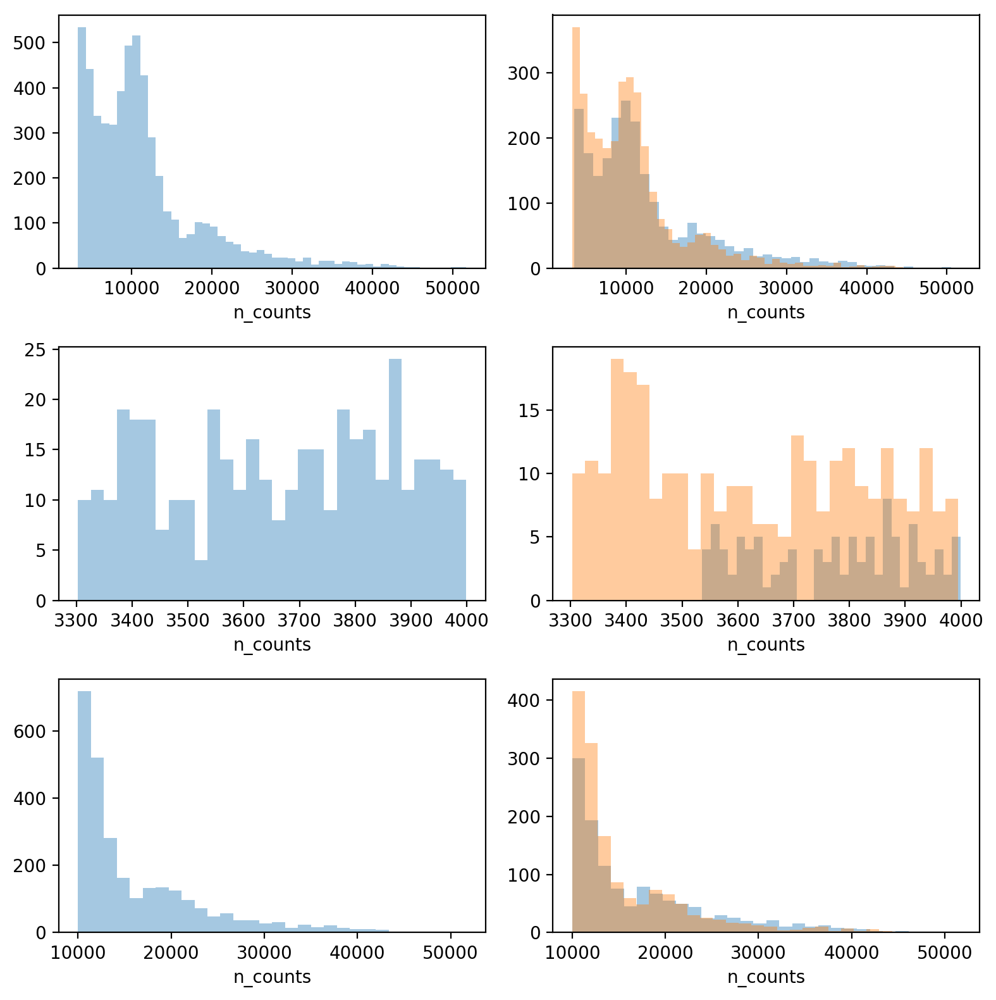

In [8]:
#Thresholding decision: counts
fig, ax = plt.subplots(3, 2, figsize=(8, 8))
sns.distplot(adata.obs['n_counts'], kde=False, ax=ax[0, 0])
sns.distplot(adata.obs['n_counts'][adata.obs['condition']=='Control'], kde=False, ax=ax[0, 1])
sns.distplot(adata.obs['n_counts'][adata.obs['condition']=='Stress'], kde=False, ax=ax[0, 1])

sns.distplot(adata.obs['n_counts'][adata.obs['n_counts']<4000], kde=False, bins=30, ax=ax[1, 0])
sns.distplot(adata.obs['n_counts'][adata.obs['condition']=='Control'][adata.obs['n_counts']<4000], kde=False, bins=30, ax=ax[1, 1])
sns.distplot(adata.obs['n_counts'][adata.obs['condition']=='Stress'][adata.obs['n_counts']<4000], kde=False, bins=30, ax=ax[1, 1])

sns.distplot(adata.obs['n_counts'][adata.obs['n_counts']>10000], kde=False, bins=30, ax=ax[2, 0])
sns.distplot(adata.obs['n_counts'][adata.obs['condition']=='Control'][adata.obs['n_counts']>10000], kde=False, bins=30, ax=ax[2, 1])
sns.distplot(adata.obs['n_counts'][adata.obs['condition']=='Stress'][adata.obs['n_counts']>10000], kde=False, bins=30, ax=ax[2, 1])
fig.tight_layout()

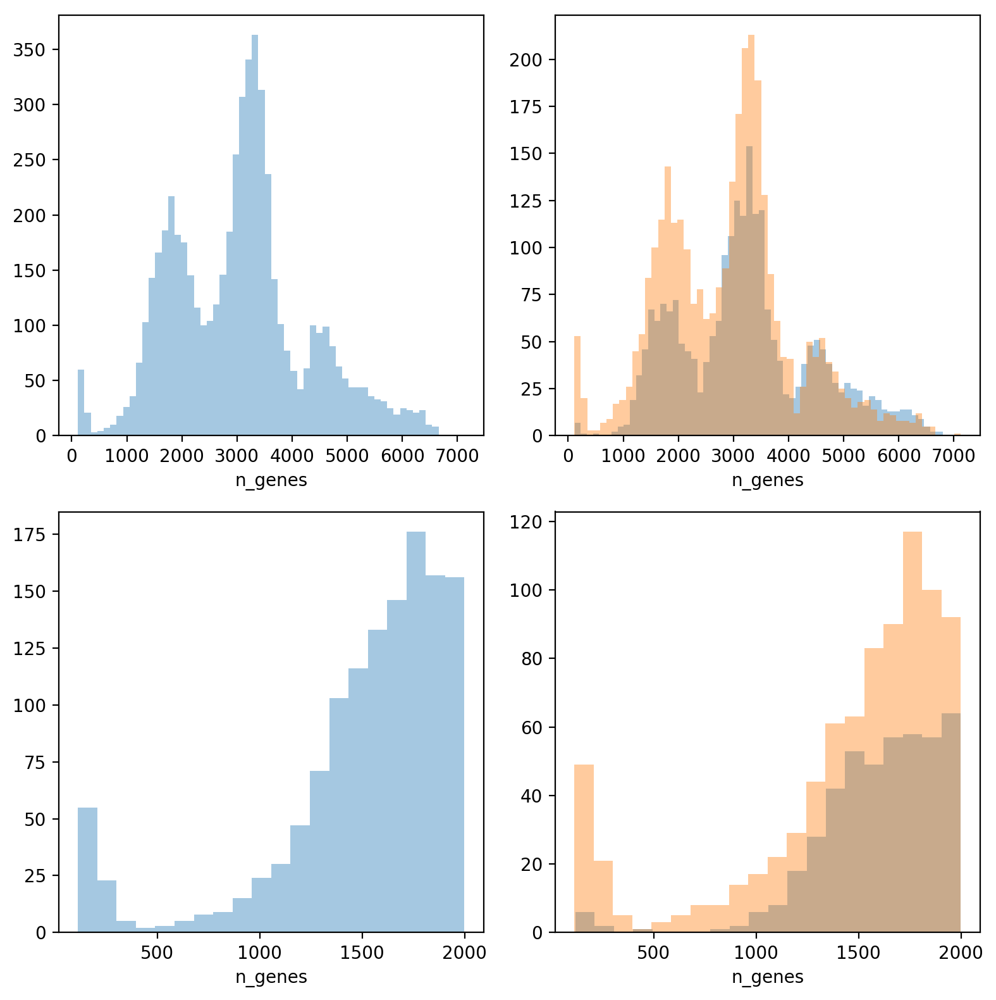

In [9]:
#Thresholding decision: genes
fig, ax = plt.subplots(2, 2, figsize=(8, 8))
sns.distplot(adata.obs['n_genes'], kde=False, bins=60, ax=ax[0, 0])
sns.distplot(adata.obs['n_genes'][adata.obs['condition']=='Control'], kde=False, bins=60, ax=ax[0, 1])
sns.distplot(adata.obs['n_genes'][adata.obs['condition']=='Stress'], kde=False, bins=60, ax=ax[0, 1])

sns.distplot(adata.obs['n_genes'][adata.obs['n_genes']<2000], kde=False, bins=20, ax=ax[1, 0])
sns.distplot(adata.obs['n_genes'][adata.obs['condition']=='Control'][adata.obs['n_genes']<2000], kde=False, bins=20, ax=ax[1, 1])
sns.distplot(adata.obs['n_genes'][adata.obs['condition']=='Stress'][adata.obs['n_genes']<2000], kde=False, bins=20, ax=ax[1, 1])
fig.tight_layout()

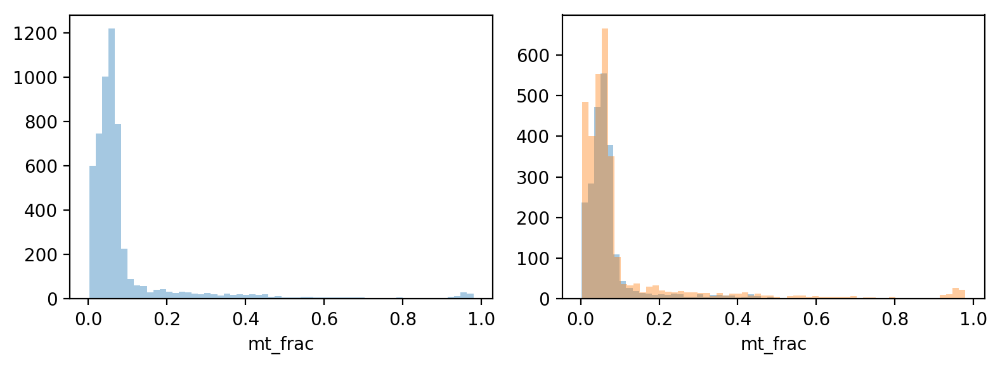

In [10]:
#Thresholding decision: genes
fig, ax = plt.subplots(1, 2, figsize=(8, 3))
sns.distplot(adata.obs['mt_frac'], kde=False, bins=60, ax=ax[0])
sns.distplot(adata.obs['mt_frac'][adata.obs['condition']=='Control'], kde=False, bins=60, ax=ax[1])
sns.distplot(adata.obs['mt_frac'][adata.obs['condition']=='Stress'], kde=False, bins=60, ax=ax[1])
fig.tight_layout()

In [11]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_counts = 1000)
print('Number of cells after min count filter: {:d}'.format(adata.n_obs))

#sc.pp.filter_cells(adata, max_counts = 45000)
#print('Number of cells after max count filter: {:d}'.format(adata.n_obs))

adata = adata[adata.obs['mt_frac'] < 0.25]
print('Number of cells after MT filter: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_genes = 400)
print('Number of cells after gene filter: {:d}'.format(adata.n_obs))

Total number of cells: 5513
Number of cells after min count filter: 5513
Number of cells after MT filter: 5005


Trying to set attribute `.obs` of view, making a copy.


Number of cells after gene filter: 5005


In [12]:
print('Total number of genes: {:d}'.format(adata.n_vars))

# Min 20 cells - filters out 0 count genes
sc.pp.filter_genes(adata, min_cells=20)
print('Number of genes after cell filter: {:d}'.format(adata.n_vars))

Total number of genes: 27998
filtered out 14001 genes that are detectedin less than 20 cells
Number of genes after cell filter: 13997


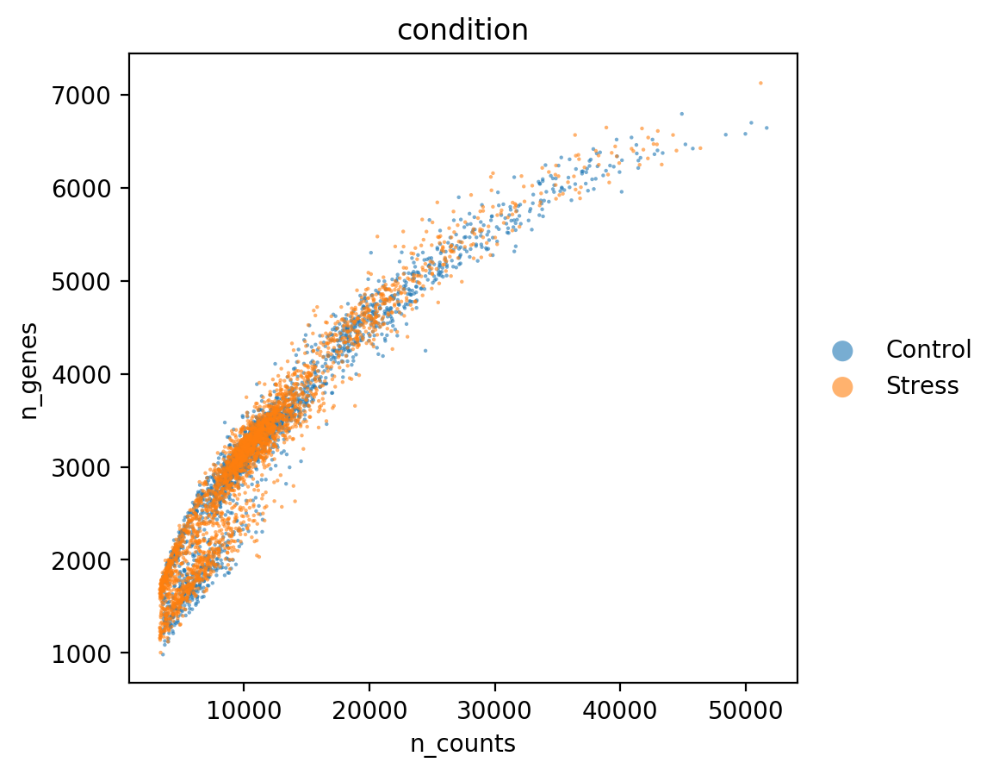

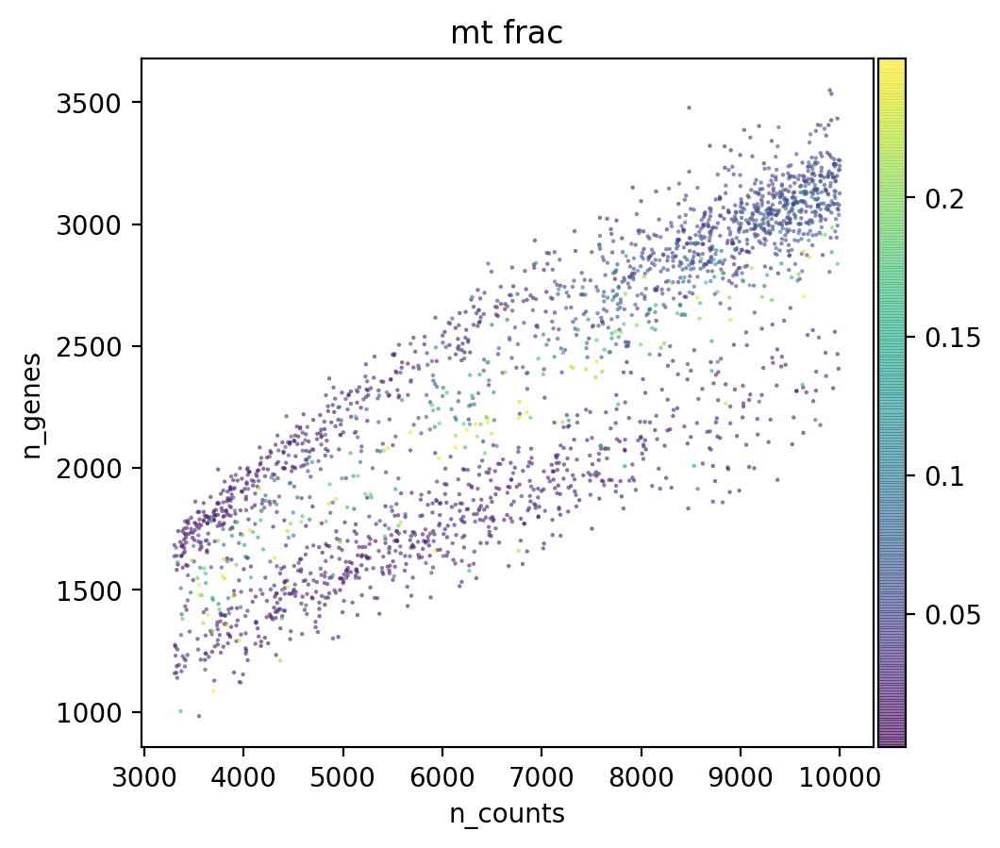

In [13]:
#Data quality summary plots
p1 = sc.pl.scatter(adata, 'n_counts', 'n_genes', size=10, color='condition', alpha=0.6)
p2 = sc.pl.scatter(adata[adata.obs['n_counts']<10000], 'n_counts', 'n_genes', color='mt_frac', size=10, alpha=0.6)

In [14]:
import scrublet as scr
scrub = scr.Scrublet(adata.X)
doublet_scores, predicted_doublets = scrub.scrub_doublets()
adata.obs['doublet_scores'] = doublet_scores
adata.obs['predicted_doublets'] = predicted_doublets

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.37
Detected doublet rate = 2.5%
Estimated detectable doublet fraction = 44.9%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 5.7%
Elapsed time: 11.4 seconds


(<Figure size 1600x600 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7ff8088e8ed0>,
       dtype=object))

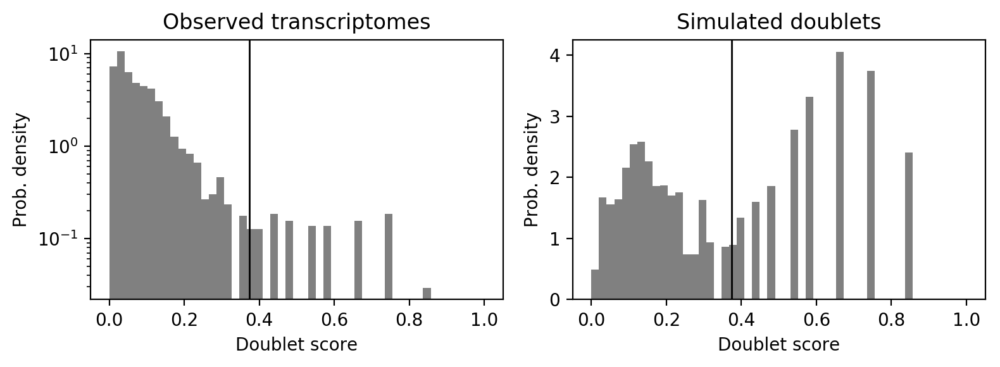

In [15]:
scrub.plot_histogram()

In [16]:
adata = adata[~adata.obs['predicted_doublets']]
print('Number of cells after doublet filter: {:d}'.format(adata.n_obs))

Number of cells after doublet filter: 4878


In [21]:
import pickle
with open('./adrenal_size_factors.pkl', 'wb') as f:
    pickle.dump(adata_ref.obs['size_factors'], f)

NameError: name 'adata_ref' is not defined

# Normalization

In [ ]:
#Perform a clustering for scran normalization in clusters
#adata_pp = adata.copy()
#sc.pp.normalize_per_cell(adata_pp, counts_per_cell_after=1e6)
#sc.pp.log1p(adata_pp)
#sc.pp.pca(adata_pp, n_comps=15)
#sc.pp.neighbors(adata_pp)
#sc.tl.louvain(adata_pp, key_added='groups', resolution=0.5)

In [ ]:
#Preprocess variables for scran normalization
#input_groups = adata_pp.obs['groups']
#data_mat = adata.X.T

In [ ]:
#%%R -i data_mat -i input_groups -o size_factors

#size_factors = computeSumFactors(data_mat, clusters=input_groups, min.mean=0.1)

Trying to set attribute `.obs` of view, making a copy.


<_io.BufferedReader name='./adrenal_size_factors.pkl'>


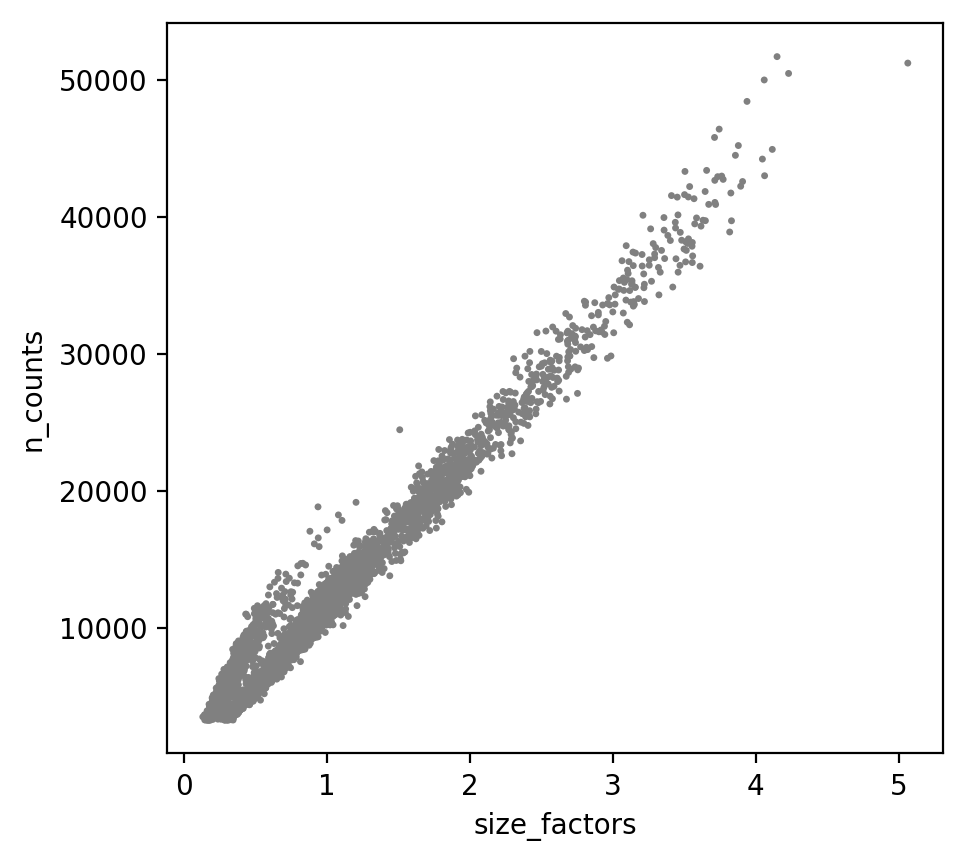

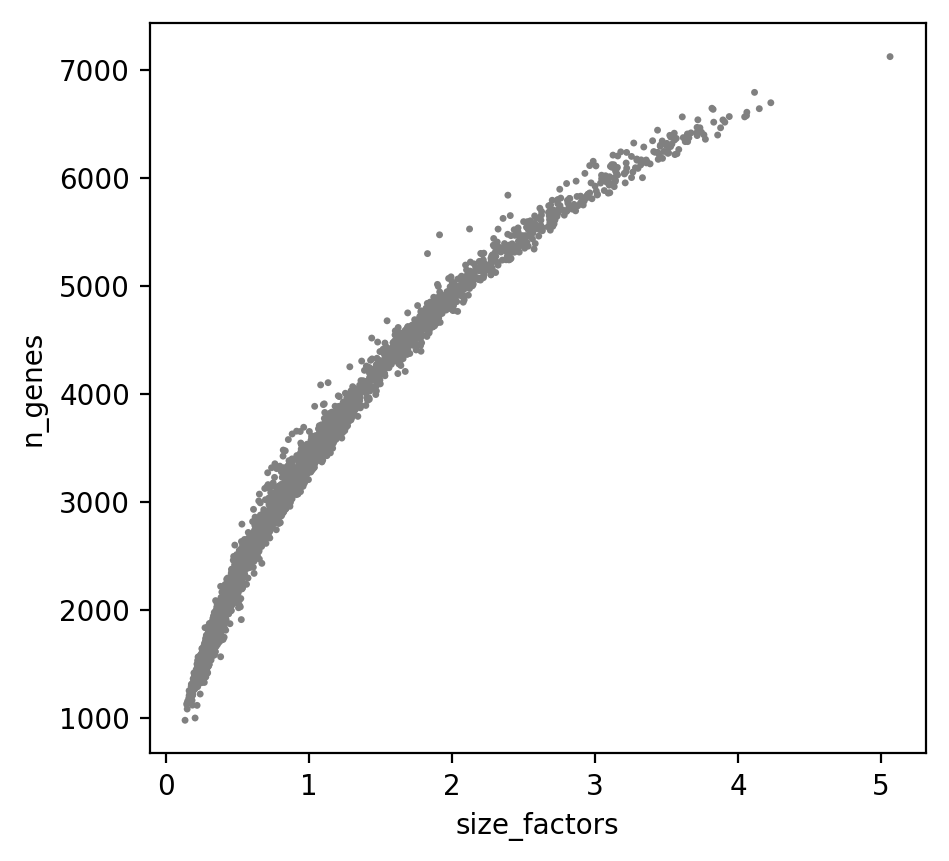

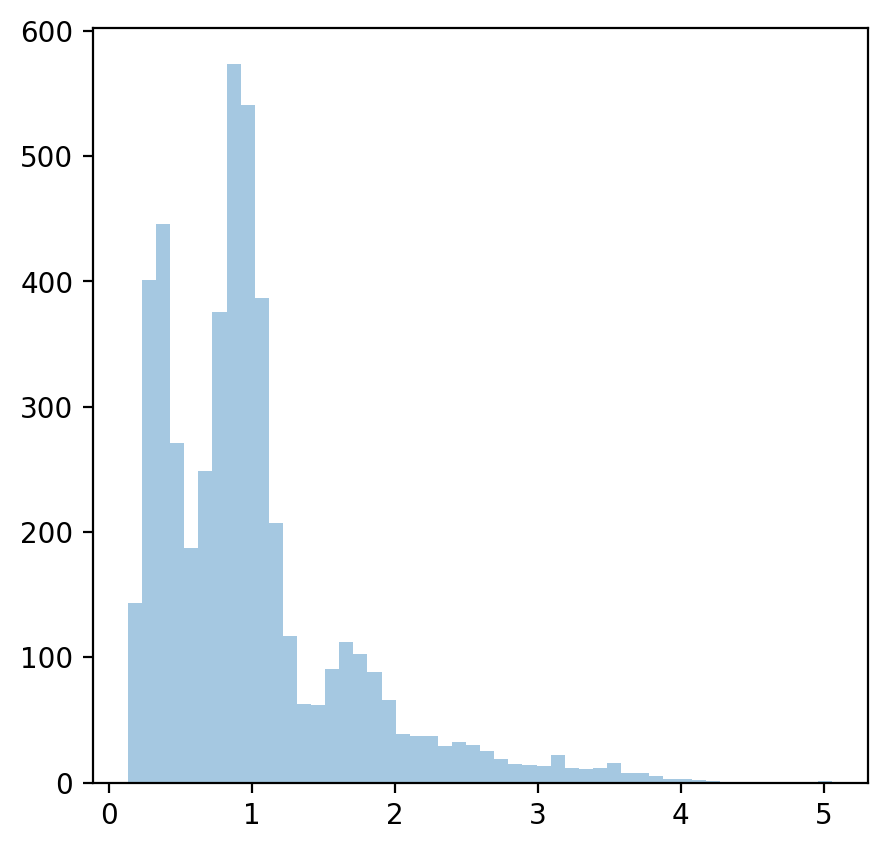

In [25]:
# Visualize the estimated size factors
#adata.obs['size_factors'] = size_factors
with open('./adrenal_size_factors.pkl', 'rb') as f:
    print(f)
    size_factors = pickle.load(f)

adata.obs['size_factors'] = size_factors

sc.pl.scatter(adata, 'size_factors', 'n_counts')
sc.pl.scatter(adata, 'size_factors', 'n_genes')

sns.distplot(size_factors, bins=50, kde=False)
plt.show()

In [26]:
#Keep the count data in a counts layer
adata.layers["counts"] = adata.X.copy()

In [27]:
#Normalize adata 
adata.X /= adata.obs['size_factors'].values[:,None]
sc.pp.log1p(adata)

In [28]:
# Store the full data set in 'raw' as log-normalised data for statistical testing
adata.raw = adata

# Batch correction

In [29]:
# ComBat batch correction
sc.pp.combat(adata, key='condition')

Standardizing Data across genes.

Found 2 batches

Found 0 numerical variables:
	

Fitting L/S model and finding priors

Finding parametric adjustments



/Users/carlo_dedonno/anaconda3/envs/hpa2/lib/python3.7/site-packages/scanpy/preprocessing/_combat.py:269: NumbaWarning: 
Compilation is falling back to object mode WITH looplifting enabled because Function "_it_sol" failed type inference due to: No implementation of function Function(<built-in function abs>) found for signature:
 
 >>> abs(array(float64, 1d, C))
 
There are 4 candidate implementations:
     - Of which 2 did not match due to:
     Type Restricted Function in function 'abs': File: unknown: Line unknown.
       With argument(s): '(array(float64, 1d, C))':
      No match for registered cases:
       * (int8,) -> int8
       * (int16,) -> int16
       * (int32,) -> int32
       * (int64,) -> int64
       * (uint8,) -> uint8
       * (uint16,) -> uint16
       * (uint32,) -> uint32
       * (uint64,) -> uint64
       * (float32,) -> float32
       * (float64,) -> float64
       * (complex64,) -> float32
       * (complex128,) -> float64
     - Of which 2 did not match due to

Adjusting data



# HVG

In [30]:
sc.pp.highly_variable_genes(adata, flavor='cell_ranger', n_top_genes=4000)
print('\n','Number of highly variable genes: {:d}'.format(np.sum(adata.var['highly_variable'])))

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)

 Number of highly variable genes: 4000


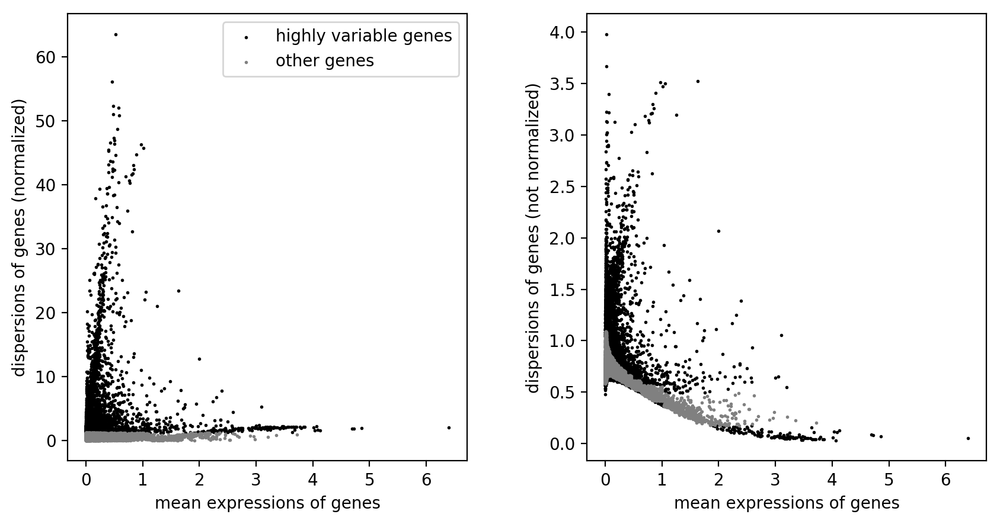

In [31]:
sc.pl.highly_variable_genes(adata)

# Visualization

In [33]:
# Calculate the visualizations
sc.pp.pca(adata, n_comps=50, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(adata)

sc.tl.tsne(adata, n_jobs=12) #Note n_jobs works for MulticoreTSNE, but not regular implementation)
sc.tl.umap(adata)
sc.tl.diffmap(adata)
#sc.tl.draw_graph(adata)

computing PCA with n_comps = 50
computing PCA on highly variable genes
    finished (0:00:03)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:00)
computing tSNE
    using 'X_pca' with n_pcs = 50
    using sklearn.manifold.TSNE with a fix by D. DeTomaso
    finished (0:00:18)
computing UMAP
    finished (0:00:07)
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.99981993 0.9995567  0.9940149  0.990493   0.988261
     0.9766891  0.97479326 0.96837413 0.9610761  0.9592449  0.9554506
     0.94767964 0.94111645 0.9346301 ]
    finished (0:00:00)


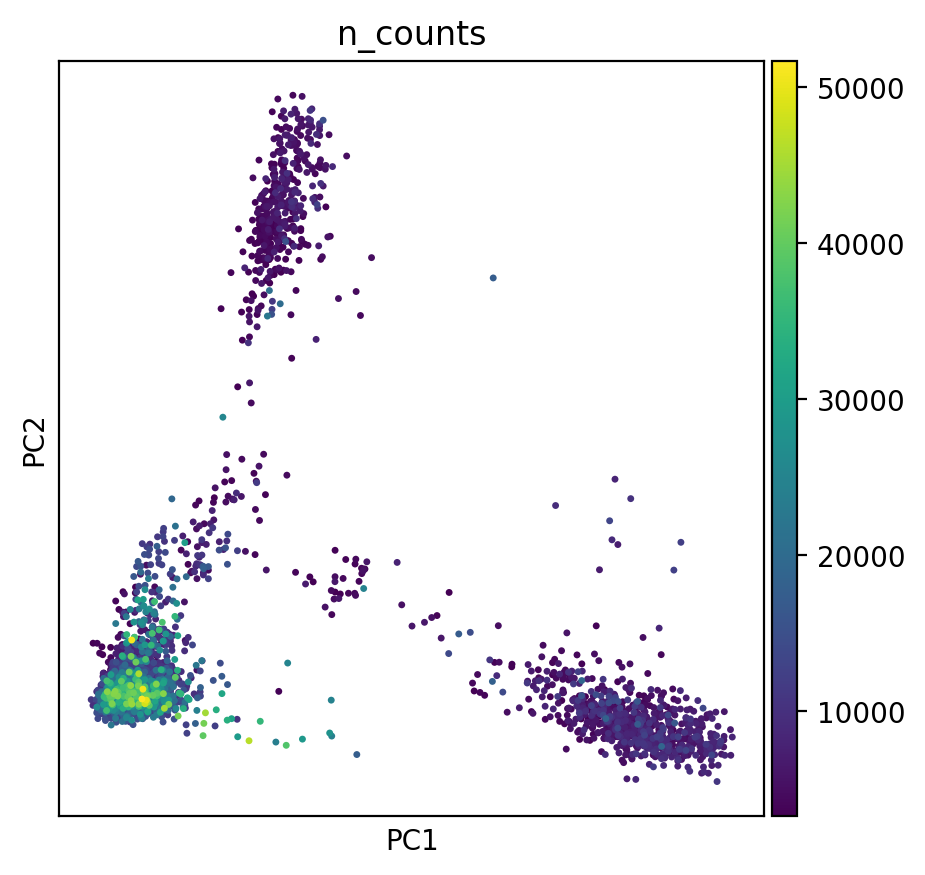

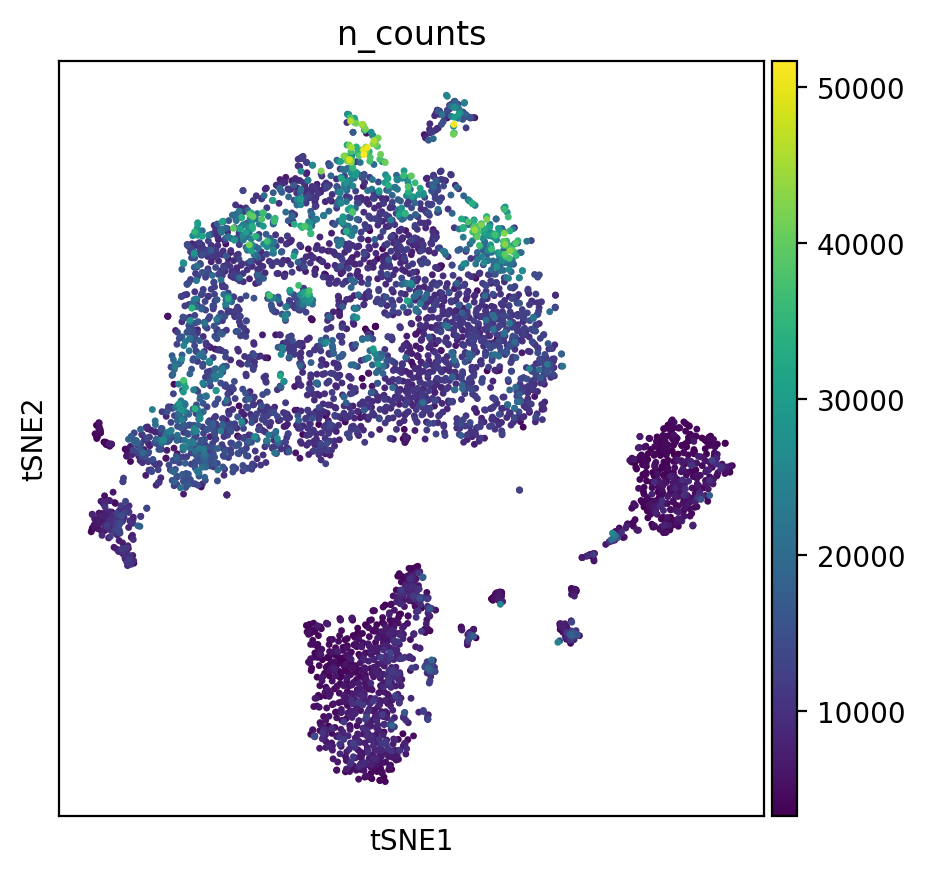

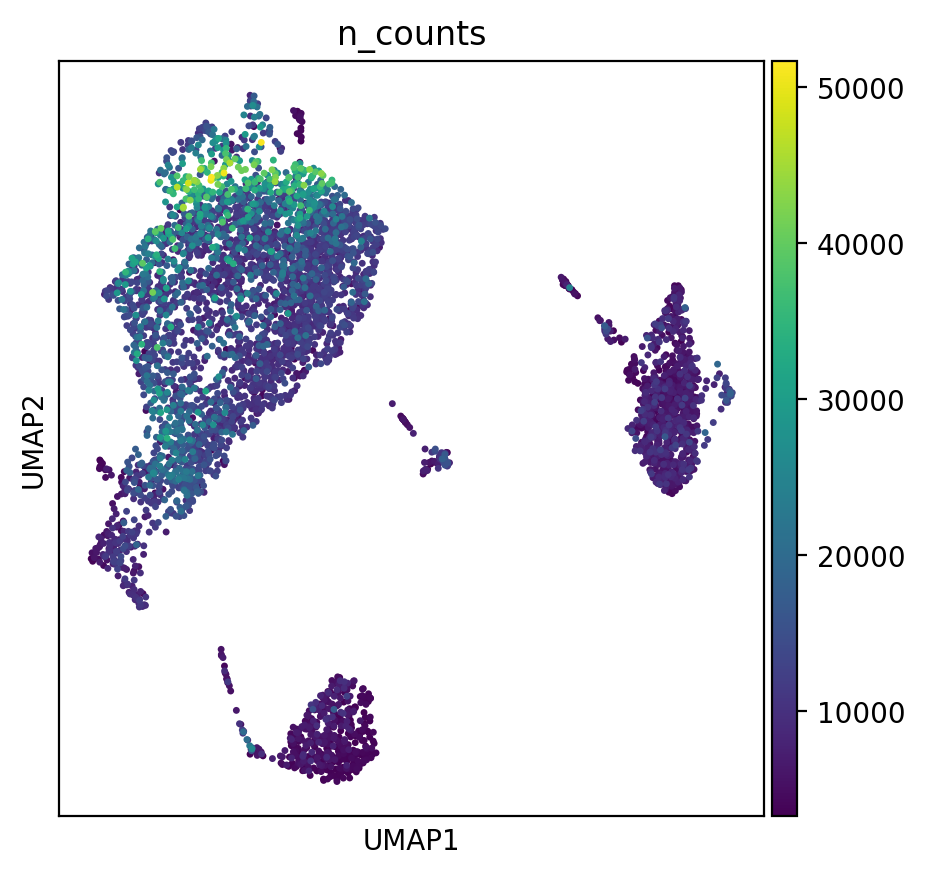

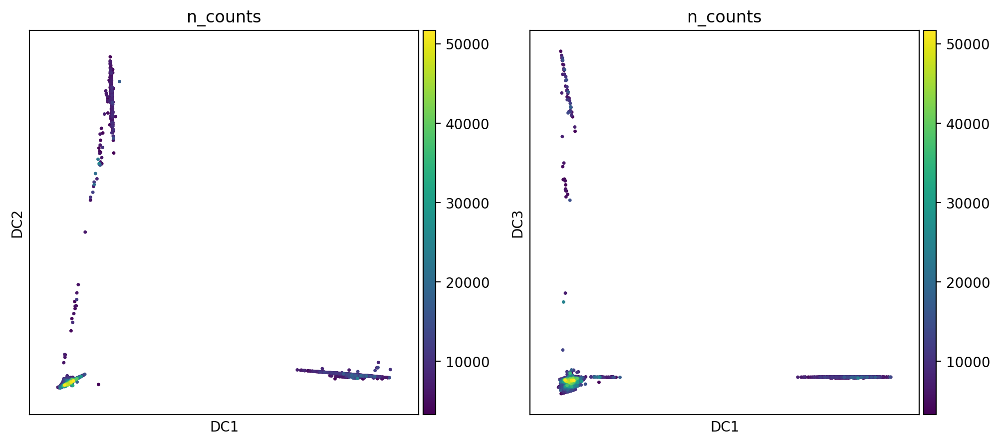

KeyError: 'draw_graph'

In [34]:
sc.pl.pca_scatter(adata, color='n_counts')
sc.pl.tsne(adata, color='n_counts')
sc.pl.umap(adata, color='n_counts')
sc.pl.diffmap(adata, color='n_counts', components=['1,2','1,3'])
sc.pl.draw_graph(adata, color='n_counts')

# Cell cycle scoring

In [ ]:
#Score cell cycle and visualize the effect:
cc_genes_file = '../MRGR_Stress/Macosko_cell_cycle_genes.txt'
cc_genes = pd.read_table(cc_genes_file, delimiter='\t')
s_genes = cc_genes['S'].dropna()
g2m_genes = cc_genes['G2.M'].dropna()

s_genes_mm = [gene.lower().capitalize() for gene in s_genes]
g2m_genes_mm = [gene.lower().capitalize() for gene in g2m_genes]

s_genes_mm_ens = adata.var_names[np.in1d(adata.var_names, s_genes_mm)]
g2m_genes_mm_ens = adata.var_names[np.in1d(adata.var_names, g2m_genes_mm)]

sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes_mm_ens, g2m_genes=g2m_genes_mm_ens)

In [ ]:
sc.pl.umap(adata, color=['S_score', 'G2M_score'], use_raw=False)
sc.pl.umap(adata, color='phase', use_raw=False)

# Analysis

In [26]:
# Perform clustering - using highly variable genes
sc.tl.louvain(adata, key_added='louvain_r1')
sc.tl.louvain(adata, resolution=0.5, key_added='louvain_r0.5', random_state=10)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 16 clusters and added
    'louvain_r1', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 12 clusters and added
    'louvain_r0.5', the cluster labels (adata.obs, categorical) (0:00:00)


In [27]:
adata.obs['louvain_r0.5'].value_counts()

0     1389
1      847
2      821
3      640
4      411
5      357
6      137
7       80
8       62
9       61
10      43
11      30
Name: louvain_r0.5, dtype: int64

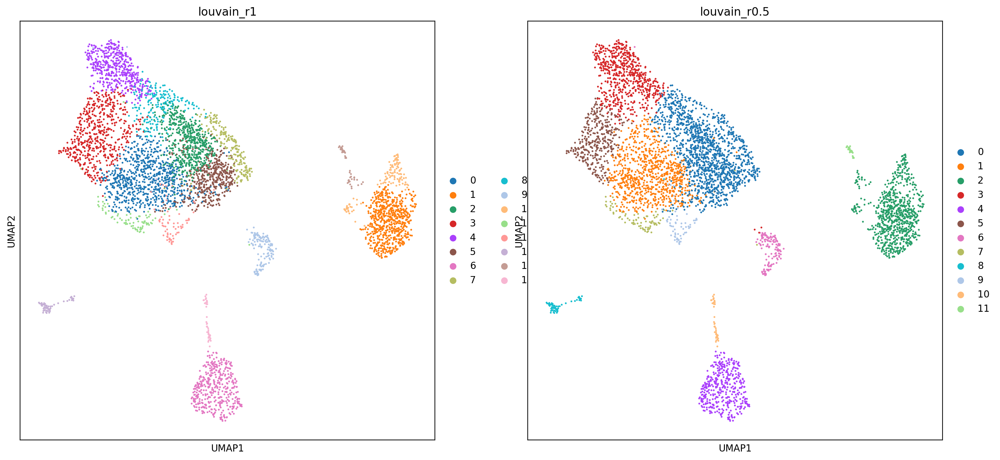

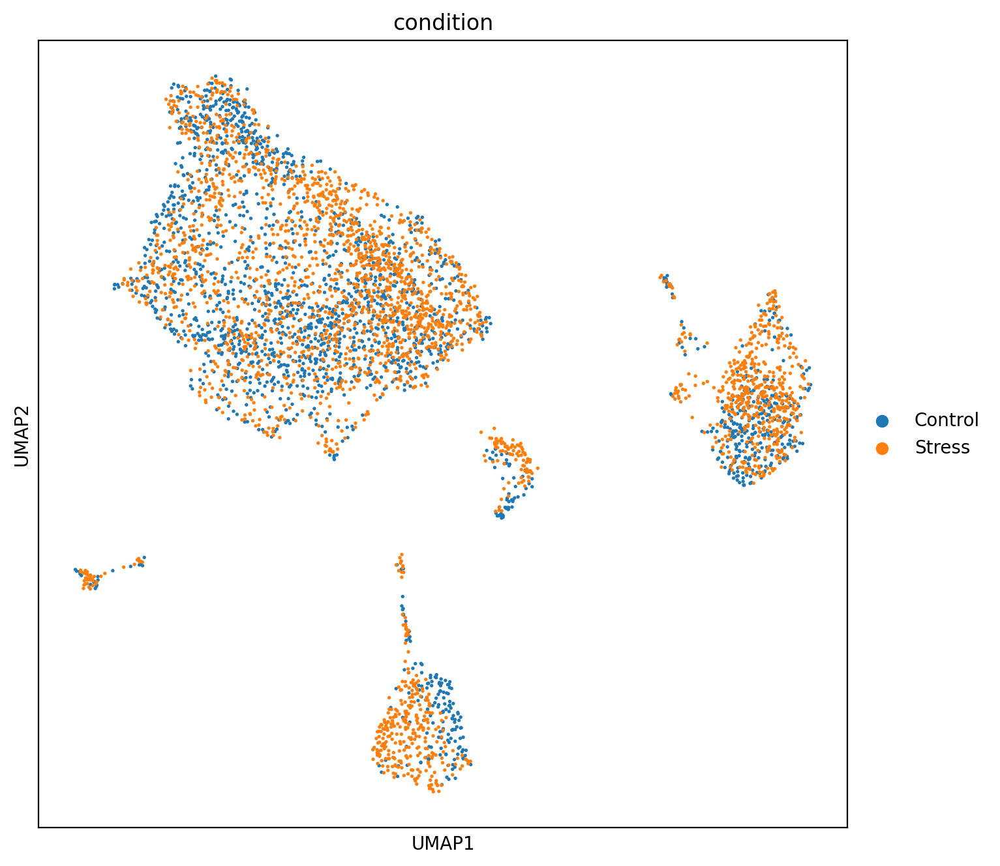

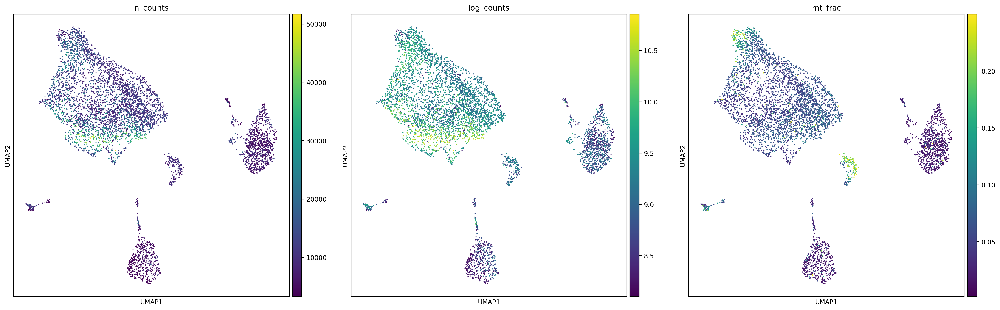

In [29]:
#Visualize the clustering and how this is reflected by different technical covariates
plt.rcParams['figure.figsize'] = (8, 8)
sc.pl.umap(adata, color=['louvain_r1', 'louvain_r0.5'], size=15, save='clusters.png')
sc.pl.umap(adata, color=['condition'], size=15, save='conditions.png')
sc.pl.umap(adata, color=['n_counts', 'log_counts', 'mt_frac'], size=15, save='technical_vars.png')

# Marker genes

In [4]:
#Calculate marker genes
sc.tl.rank_genes_groups(adata, groupby='louvain_r1', key_added='rank_genes_r1')

ranking genes
    finished: added to `.uns['rank_genes_r1']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:06)


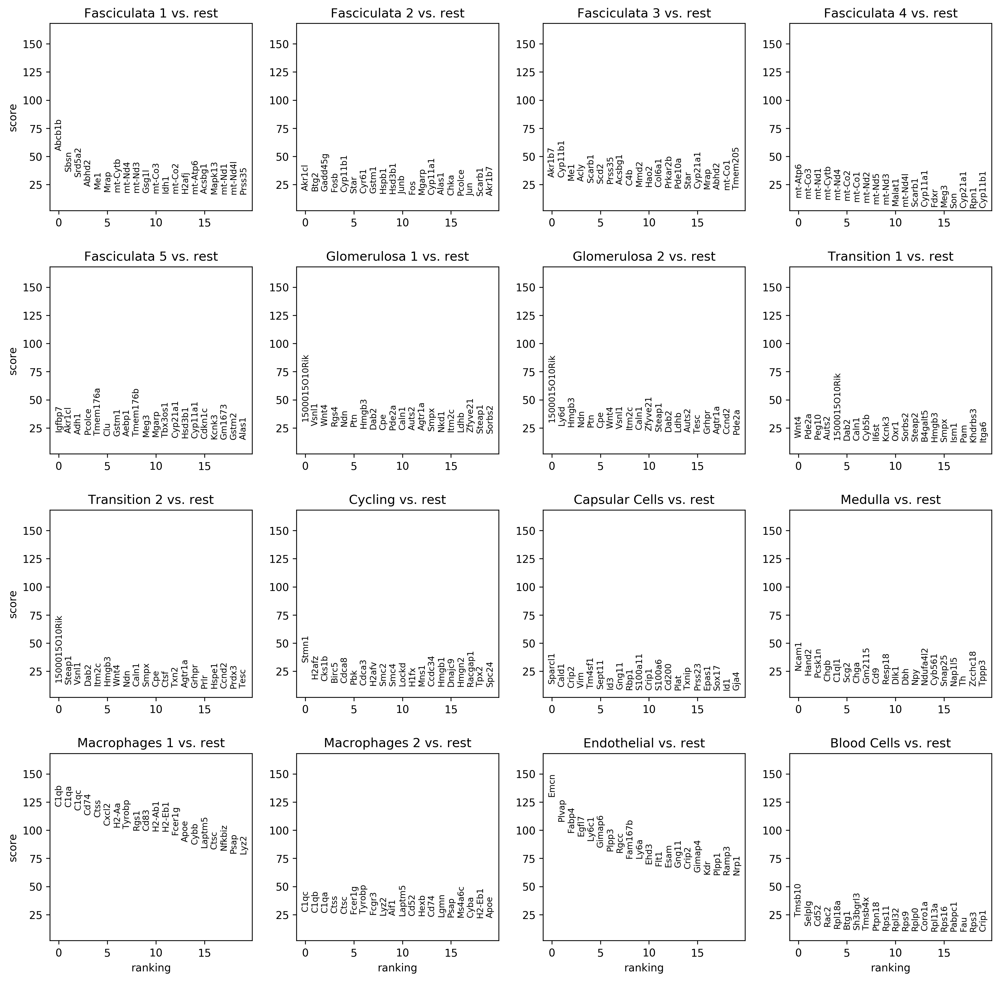

In [47]:
plt.rcParams['figure.figsize'] = (4,4)
sc.pl.rank_genes_groups(adata, save='_adrenal.png', key='rank_genes_r1')

In [5]:
writer = pd.ExcelWriter('adrenal_r1_markers_pval.xlsx', engine='xlsxwriter')
names = adata.uns['rank_genes_r1']['names']
scores = adata.uns['rank_genes_r1']['scores']
pval = adata.uns['rank_genes_r1']['pvals']
adjp = adata.uns['rank_genes_r1']['pvals_adj']
foldchanges = adata.uns['rank_genes_r1']['logfoldchanges']
for clust in adata.obs['louvain_r1'].cat.categories:
        pd.DataFrame({'Names':names[clust],
                      'Scores':scores[clust],
                      'pval': pval[clust],
                      'adj_pval': adjp[clust],
                      'Log2foldchanges':foldchanges[clust]}).to_excel(writer,sheet_name=clust)
writer.save()

del scores, names, writer, foldchanges, clust

In [ ]:
adata.obs['louvain_r1'].unique()[1:3]

In [ ]:
sc.pl.rank_genes_groups_heatmap(adata, groups=['Zona Fasciculata 1', 'Zona Fasciculata 2'], \
                               key='rank_genes_r1')

In [ ]:
#Plot marker genes
n_groups=16
fig, ax = plt.subplots(5, 1)
j = 0
for i in np.arange(0, n_groups, 3):
    ax[0, j] = sc.pl.rank_genes_groups(adata, key='rank_genes_r1', groups=[adata.obs['louvain_r1'].unique()[i],\
                                                            adata.obs['louvain_r1'].unique()[i+1],\
                                                            adata.obs['louvain_r1'].unique()[i+2]], fontsize=12, show=False)
    j += 1

In [ ]:
adata.obs['louvain_r1'].unique()

In [5]:
marker_genes = dict()
filepath = './data/adrenal_markers.txt'
with open(filepath) as fp:
    for cnt, line in enumerate(fp):
        if cnt > 0:
            gene, cell= line.split('\t')
            cell = cell.rstrip('\n')
            print(gene, cell)
            if cell not in set(marker_genes.keys()):
                marker_genes[cell] = [gene]
            else:
                marker_genes[cell].append(gene)

Ctnnb1 Progenitor
Shh Progenitor
Nr5a1 Progenitor
Cyp11a1 All Cortex
Cyp21a1 All Cortex
Fdx1 All Cortex
Fdxr All Cortex
Hsd3b1 All Cortex
Soat1 All Cortex
Star All Cortex
Fgfr2 All Cortex
Mgarp All Cortex
Mc2r All Cortex
Akr1b10 All Cortex
Akr1b3 All Cortex
Akr1b7 All Cortex
Akr1b8 All Cortex
Akr1cl All Cortex
Cyp11b1 Zona Fasciculata
Mrap Zona Fasciculata
Dhcr7 Zona Fasciculata
Hhex Zona Fasciculata
Agtr1a Zona Glomerulosa
Cyp11b2 Zona Glomerulosa
Peg10 Zona Glomerulosa
Wnt4 Zona Glomerulosa
Kcnn2 Zona Glomerulosa
Ndn Zona Glomerulosa
Hsd3b6 Zona Glomerulosa
Ngfr Progenitor
Sox10 Progenitor
Chd7 Progenitor
Foxd3 Progenitor
Notch1 Progenitor
Vim Progenitor
Erbb3 Medulla
Fabp7 Medulla
Mbp Medulla
Ncam1 Medulla
Plp1 Medulla
S100b Medulla
Chga Medulla
Chgb Medulla
Dbh Medulla
Ddc Medulla
Elavl4 Medulla
Npy Medulla
Pnmt Medulla
Ptprn Medulla
Scg2 Medulla
Th Medulla
Dlk1 Medulla
Adgrf5 Progenitor
Id1 Progenitor
Kdr Progenitor
Tek Progenitor
Acta2 Vascular Smooth muscle 
Cald1 Vascular Smoot

In [ ]:
cell_annotation = sc.tl.marker_gene_overlap(adata, marker_genes, key='rank_genes_r1')
cell_annotation

In [ ]:
cell_annotation_norm = sc.tl.marker_gene_overlap(adata, marker_genes, key='rank_genes_r1', normalize='reference')
sns.heatmap(cell_annotation_norm, cbar=False, annot=True)

In [ ]:
adata.rename_categories('louvain_r1', ['Transition 1', 'Macrophages', 'Zona Glomerulosa 1', 'Zona Fasciculata 5',\
                                         'Zona Fasciculata 3', 'Endothelial', 'Zona Fasciculata 2', 'Zona Glomerulosa 2',\
                                         'Transition 2', 'Zona Fasciculata 1', 'Macrophages 2', 'Medulla',\
                                         'Cycling', 'Unknown', 'Capsular Cells', 'Zona Fasciculata 4'])

In [ ]:
adata.obs['louvain_r1'].value_counts()

In [ ]:
plt.rcParams['figure.figsize']=(8, 8)
sc.pl.umap(adata, color='louvain_r1', size=15, legend_loc='on data')
sc.pl.draw_graph(adata, color='louvain_r1', size=15, legend_loc='on data')

In [ ]:
plt.rcParams['figure.figsize'] = (5, 5)
sc.pl.pca_overview(adata)

In [6]:
adata.obs['louvain_r1'] = adata.obs['louvain_r1'].cat.rename_categories(['Transition 1', 'Macrophages 1', 'Glomerulosa 1', 'Fasciculata 5', 'Fasciculata 3', 'Endothelial', 'Fasciculata 2', 'Glomerulosa 2',\
                                              'Transition 2', 'Fasciculata 1', 'Macrophages 2', 'Medulla', 'Cycling', 'Blood Cells', 'Capsular Cells', 'Fasciculata 4'])

In [7]:
adata.obs['louvain_r1'] = adata.obs['louvain_r1'].cat.reorder_categories(['Fasciculata 1', 'Fasciculata 2', 'Fasciculata 3', 'Fasciculata 4', 'Fasciculata 5', 'Glomerulosa 1',\
                                               'Transition 1', 'Glomerulosa 2', 'Transition 2', 'Cycling', 'Capsular Cells', 'Medulla', 'Macrophages 1', 'Macrophages 2',\
                                               'Endothelial', 'Blood Cells'])

In [6]:
adata.obs['louvain_r1'] = adata.obs['louvain_r1'].cat.rename_categories(['Fasciculata 1', 'Fasciculata 2', 'Fasciculata 3', 'Fasciculata 4', 'Fasciculata 5', 'Glomerulosa 1',\
                                               'Glomerulosa 2', 'Transition 1', 'Transition 2', 'Cycling', 'Capsular Cells', 'Medulla', 'Macrophages 1', 'Macrophages 2',\
                                               'Endothelial', 'Blood Cells'])

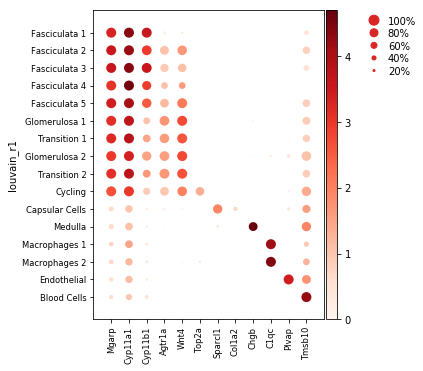

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[4.199999999999999, 0, 0.2, 0.5, 0.25])

In [8]:
sc.pl.dotplot(adata, var_names=['Mgarp', 'Cyp11a1', 'Cyp11b1', 'Agtr1a', 'Wnt4', 'Top2a', 'Sparcl1', 'Col1a2', 'Chgb', 'C1qc', 'Plvap', 'Tmsb10'], groupby='louvain_r1', dendrogram=False, save='_adrenal.svg')

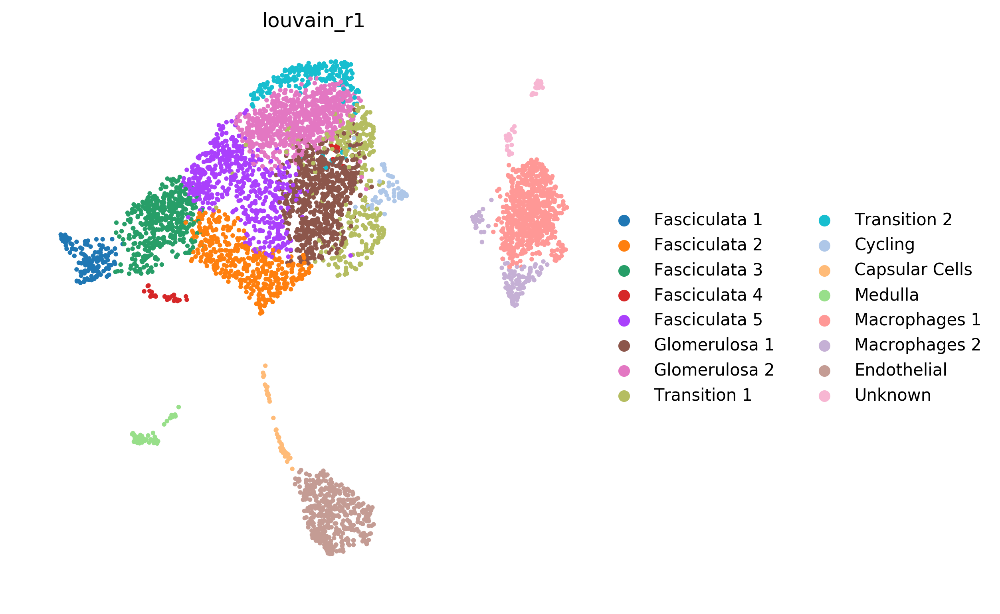

In [5]:
plt.rcParams['figure.figsize'] = (6,6)
plt.rcParams['figure.dpi'] = 300
sc.pl.umap(adata, color='louvain_r1', frameon=False, save='_adrenal_r1.png', size=30, palette=sc.pl.palettes.default_20)

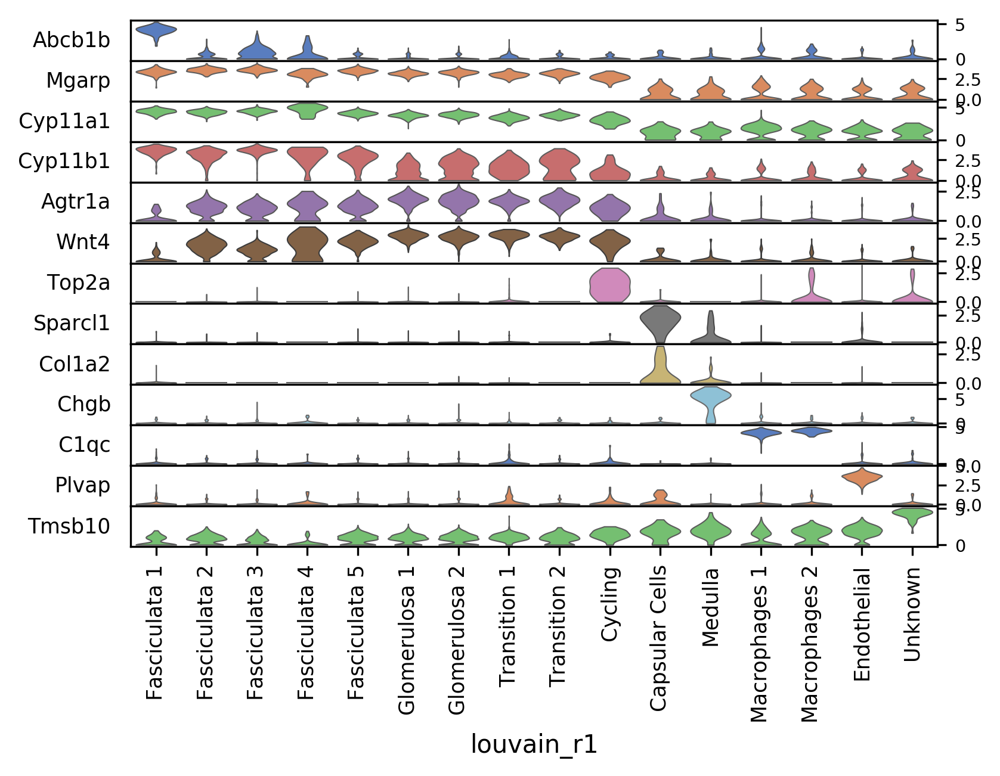

In [10]:
plt.rcParams['figure.figsize'] = (8,8)
plt.rcParams['figure.dpi'] = 300
plt.rcParams['font.size'] = 10
sc.pl.stacked_violin(adata, var_names=['Abcb1b', 'Mgarp', 'Cyp11a1', 'Cyp11b1', 'Agtr1a', 'Wnt4', 'Top2a', 'Sparcl1', 'Col1a2', 'Chgb', 'C1qc', 'Plvap', 'Tmsb10'],\
                     groupby='louvain_r1', dendrogram=False, save='_adrenal_stacked_horizontal.png', use_raw=True, swap_axes=True)#, row_palette=adata.uns['louvain_r1_colors'])

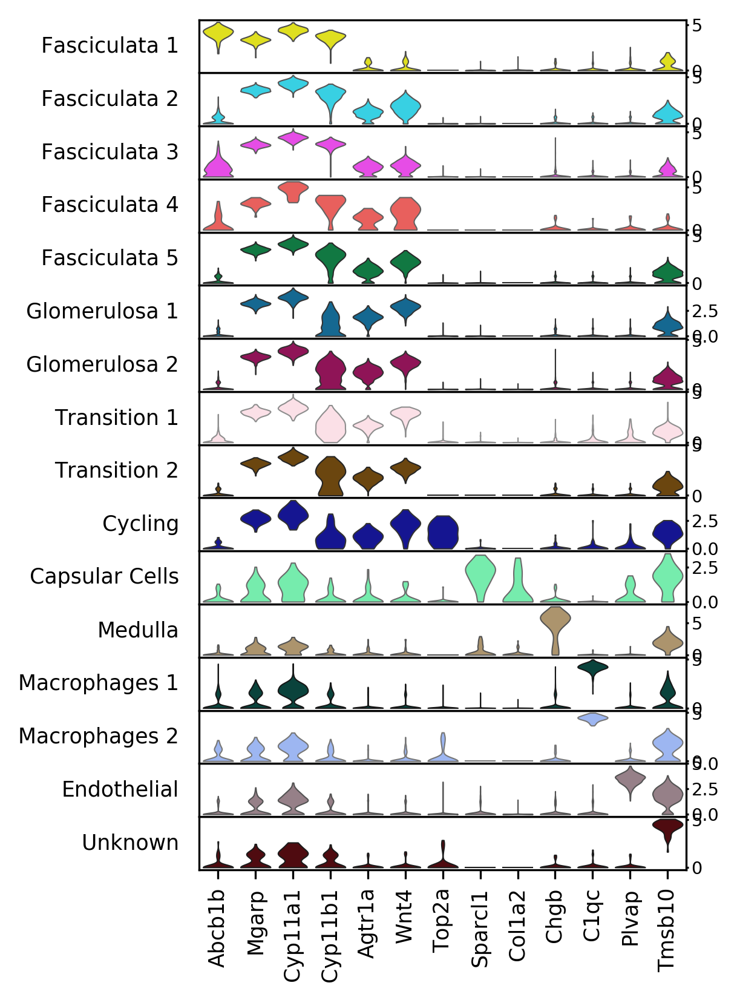

In [6]:
plt.rcParams['figure.figsize'] = (8,8)
plt.rcParams['figure.dpi'] = 300
plt.rcParams['font.size'] = 10
sc.pl.stacked_violin(adata, var_names=['Abcb1b', 'Mgarp', 'Cyp11a1', 'Cyp11b1', 'Agtr1a', 'Wnt4', 'Top2a', 'Sparcl1', 'Col1a2', 'Chgb', 'C1qc', 'Plvap', 'Tmsb10'],\
                     groupby='louvain_r1', dendrogram=False, save='_adrenal_stacked_vertical_colors.png', use_raw=True, swap_axes=False, row_palette=adata.uns['louvain_r1_colors'])

In [5]:
adata.obs['louvain_r1'] = adata.obs['louvain_r1'].cat.rename_categories({'Blood Cells': 'Unknown'})

In [8]:
adata.write('../data/processed/adrenal_renamed_latest.h5ad')

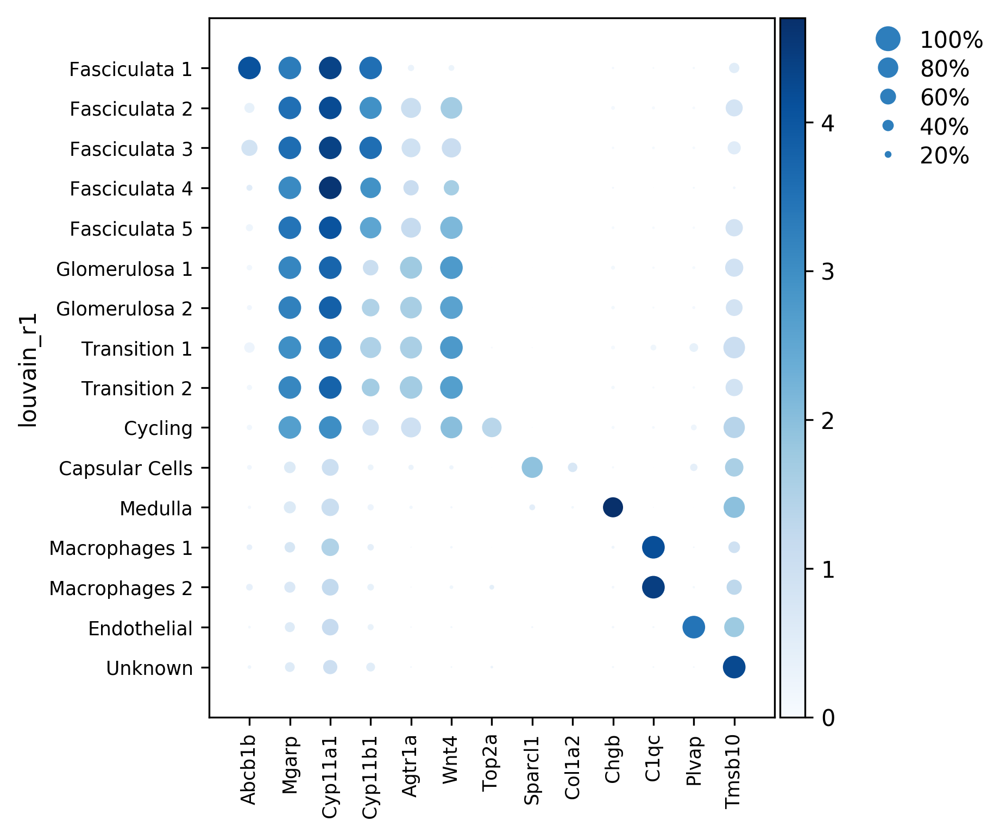

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[4.55, 0, 0.2, 0.5, 0.25])

In [7]:
plt.rcParams['figure.figsize'] = (8,8)
plt.rcParams['figure.dpi'] = 300
plt.rcParams['font.size'] = 10
sc.pl.dotplot(adata, var_names=['Abcb1b', 'Mgarp', 'Cyp11a1', 'Cyp11b1', 'Agtr1a', 'Wnt4', 'Top2a', 'Sparcl1', 'Col1a2', 'Chgb', 'C1qc', 'Plvap', 'Tmsb10'],\
                     groupby='louvain_r1', dendrogram=False, save='_final_adrenal.png', use_raw=True, color_map='Blues')#, row_palette=adata.uns['louvain_r1_colors'])

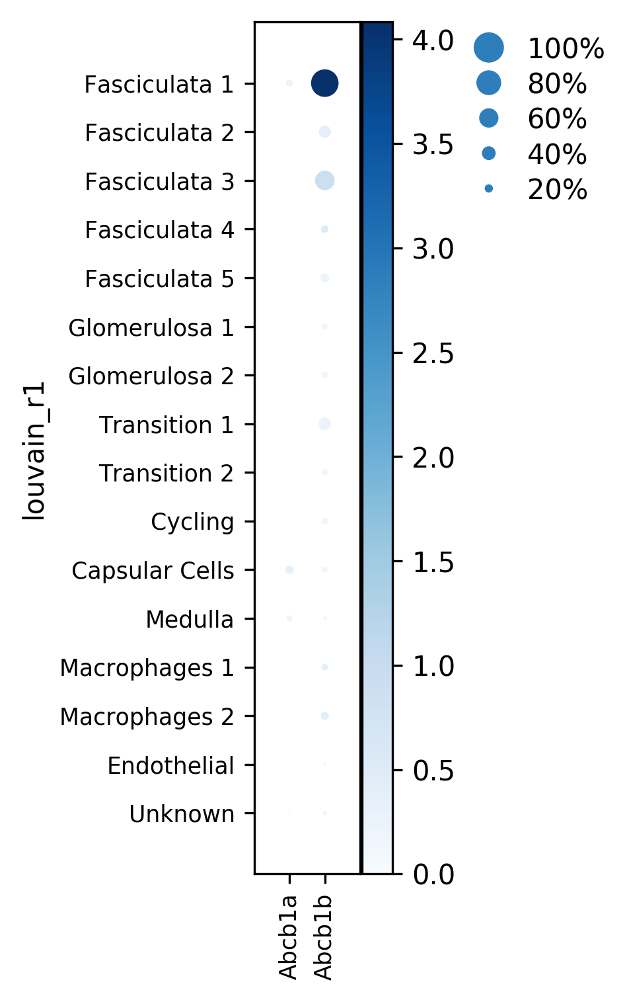

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[0.7, 0, 0.2, 0.5, 0.25])

In [9]:
plt.rcParams['font.size'] = 10
sc.pl.dotplot(adata, var_names=['Abcb1a', 'Abcb1b'],\
                     groupby='louvain_r1', dendrogram=False, save='_adrenal_abcb_vertical.png', use_raw=True,color_map='Blues')

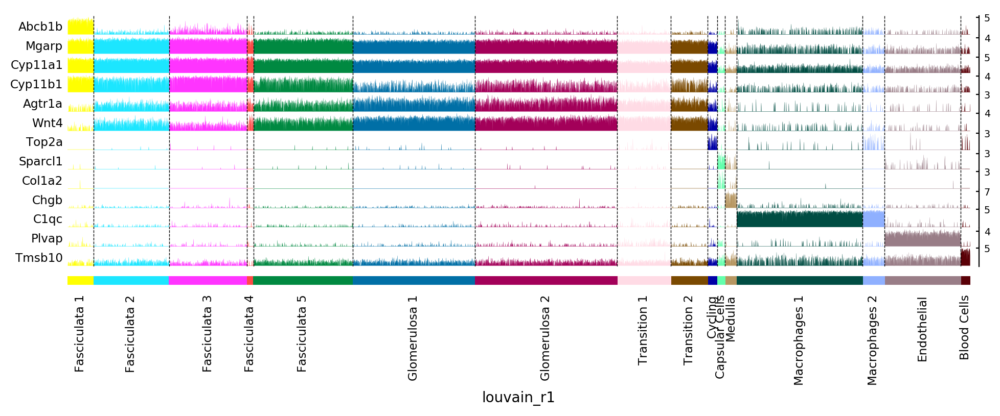

In [17]:
sc.pl.tracksplot(adata, var_names=['Abcb1b', 'Mgarp', 'Cyp11a1', 'Cyp11b1', 'Agtr1a', 'Wnt4', 'Top2a', 'Sparcl1', 'Col1a2', 'Chgb', 'C1qc', 'Plvap', 'Tmsb10'], groupby='louvain_r1', use_raw=True, save='_adrenal_tracks.png')

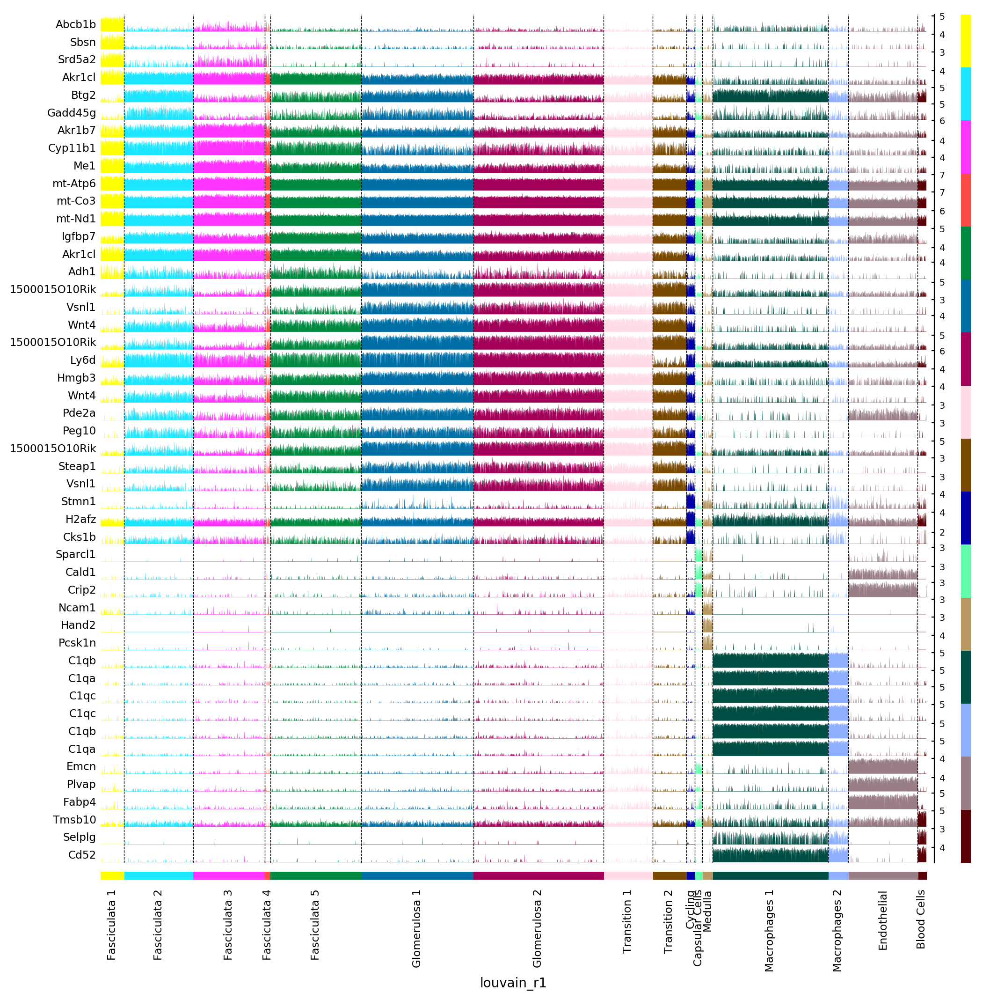

In [15]:
sc.pl.rank_genes_groups_tracksplot(adata, key='rank_genes_r1', groupby='louvain_r1', dendrogram=False, use_raw=True, n_genes=3)

In [10]:
adata.write('./results/adrenal_renamed.h5ad')

In [22]:
from rpy2 import robjects
def mast_de_groups(adata, groupby, save):
    '''Compute differential expression with the MAST package by treatment covariate within clusters provided as "groupby" and export as excel file'''
    
    #if groupby not in ['louvain_final', 'louvain_three']:
    #    raise NotImplementedError("This function is only implemented to be used with 'louvain_final' and 'louvain_three' group labels")
    
    # Define R function to run MAST analysis
    robjects.r('''
        mast_de_r <- function(adata, obs, var, clusters, groupby){
            #Prepare data sets for SingleCellExperiment data structure conversion
            #obs['wellKey'] = row.names(obs)
            #var['primerid'] = row.names(var)
            print('Deploying to R...')
            #Convert to SingleCellExperiment type
            #sca <- FromMatrix(exprsArray=data_mat, fData=var)
            sca <- SceToSingleCellAssay(adata, class = "SingleCellAssay")
            #Compute Gene detection rate
            colData(sca)$n_genes = scale(colData(sca)$n_genes)

            #Create a vector that will hold all the DE results
            output <- vector("list", length(clusters))

            count <- 0
            print('Begin computation...')
            #Loop over all louvain clusters
            for (i in clusters){
                count <- count+1
                print(i)
                #Create data subsets which should be used for testing
                if (groupby=='louvain_final') {
                    sca_sub <- subset(sca, with(colData(sca), louvain_final==i))
                } else if (groupby=='louvain_r1') {
                    sca_sub <- subset(sca, with(colData(sca), louvain_r1==i))
                } else {
                    stop()
                }

                #Filter out non-expressed genes in the subset
                sca_sub <- sca_sub[rowSums(assay(sca_sub)) != 0, ]

                #Define & run hurdle model
                zlmCond <- zlm(formula = ~condition + n_genes, sca=sca_sub)
                summaryCond <- summary(zlmCond, doLRT='conditionStress')

                summaryDt <- summaryCond$datatable

                result <- merge(summaryDt[contrast=='conditionStress' & component=='H',.(primerid, `Pr(>Chisq)`)], #p-vals
                                 summaryDt[contrast=='conditionStress' & component=='logFC', .(primerid, coef)], #logFC coefficients
                                 by='primerid') 

                #Correct for multiple testing (FDR correction) and filtering
                result[,FDR:=p.adjust(`Pr(>Chisq)`, 'fdr')]
                result[,coef:=result[,coef]/log(2)]
                names(result) <- c("gene", "pval", "log2FC", "qval")
                result = result[order(result$qval),]

                output[[count]] <- result

            }
            return(output)
        }
    ''')
    
    mast_de = robjects.globalenv['mast_de_r']
    

    
    #Create new Anndata object for use in MAST with non-batch corrected data as before
    adata_test = adata.copy()
    adata_test.X = adata.raw.X
    adata_test.obs['n_genes'] = (adata_test.X > 0).sum(1) 
    
    obs = adata_test.obs
    var = adata_test.var
    clusters = list(adata_test.obs[groupby].cat.categories)
    
    expr_dict = {adata_test.var.index[i]:{} for i in range(adata_test.shape[1])}
    expr_dict_stress = {adata_test.var.index[i]:{} for i in range(adata_test.shape[1])}
    expr_dict_ctrl = {adata_test.var.index[i]:{} for i in range(adata_test.shape[1])}
    for clust in adata_test.obs[groupby].cat.categories:
        expr = np.mean(adata_test[adata_test.obs[groupby] == clust].X, axis=0)
        expr_stress = np.mean(adata_test[(adata_test.obs['condition']=='Stress') & (adata_test.obs[groupby] == clust)].X, axis=0)
        expr_ctrl = np.mean(adata_test[(adata_test.obs['condition']=='Control') & (adata_test.obs[groupby] == clust)].X, axis=0)
        for i, gene in enumerate(adata_test.var.index):
            expr_dict[gene][clust] = expr[i]
            expr_dict_stress[gene][clust] = expr_stress[i]
            expr_dict_ctrl[gene][clust] = expr_ctrl[i]
    
    result = mast_de(adata_test, obs, var, clusters, groupby)
    result = {clusters[i]:datframe for i, datframe in enumerate(result)}
    
    writer = pd.ExcelWriter(save, engine='xlsxwriter')
    print('Number of significant DE genes:')    
    for clust in clusters:
        result[clust]['meanExpr'] = [expr_dict[gene][clust] for gene in result[clust]['gene'].values]
        result[clust]['meanExprStress'] = [expr_dict_stress[gene][clust] for gene in result[clust]['gene'].values]
        result[clust]['meanExprCtrl'] = [expr_dict_ctrl[gene][clust] for gene in result[clust]['gene'].values]
        result[clust].to_excel(writer,sheet_name=str(clust))
        print(clust+':', np.sum([result[clust]['qval']<0.05]))

    writer.save()

    return result

In [21]:
from rpy2 import robjects
def mast_de_bulk(adata, save):
    '''Compute differential expression with the MAST package by treatment covariate on the whole dataset'''
    
    #if groupby not in ['louvain_final', 'louvain_three']:
    #    raise NotImplementedError("This function is onljy implemented to be used with 'louvain_final' and 'louvain_three' group labels")
    
    # Define R function to run MAST analysis
    robjects.r('''
        mast_de_r <- function(adata, obs, var){
            #Prepare data sets for SingleCellExperiment data structure conversion
            #obs['wellKey'] = row.names(obs)
            #var['primerid'] = row.names(var)
            print('Deploying to R...')
            #Convert to SingleCellExperiment type
            #sca <- FromMatrix(exprsArray=data_mat, fData=var)
            sca <- SceToSingleCellAssay(adata, class = "SingleCellAssay")
            #Compute Gene detection rate
            colData(sca)$n_genes = scale(colData(sca)$n_genes)

            #Create a vector that will hold all the DE results

            count <- 0
            print('Begin computation...')
            #Define & run hurdle model
            zlmCond <- zlm(formula = ~condition + n_genes, sca=sca)
            summaryCond <- summary(zlmCond, doLRT='conditionStress')
            summaryDt <- summaryCond$datatable
            
            result <- merge(summaryDt[contrast=='conditionStress' & component=='H',.(primerid, `Pr(>Chisq)`)], #p-vals
                             summaryDt[contrast=='conditionStress' & component=='logFC', .(primerid, coef)], #logFC coefficients
                             by='primerid') 
                             
            #Correct for multiple testing (FDR correction) and filtering
            result[,FDR:=p.adjust(`Pr(>Chisq)`, 'fdr')]
            result[,coef:=result[,coef]/log(2)]
            names(result) <- c("gene", "pval", "log2FC", "qval")
            result = result[order(result$qval),]
            output <- result
                
            return(output)
        }
    ''')
    
    mast_de = robjects.globalenv['mast_de_r']
    

    
    #Create new Anndata object for use in MAST with non-batch corrected data as before
    adata_test = adata.copy()
    adata_test.X = adata.raw.X
    adata_test.obs['n_genes'] = (adata_test.X > 0).sum(1) 
    
    obs = adata_test.obs
    var = adata_test.var
    
    expr_dict = {adata_test.var.index[i]:{} for i in range(adata_test.shape[1])}
    expr_dict_stress = {adata_test.var.index[i]:{} for i in range(adata_test.shape[1])}
    expr_dict_ctrl = {adata_test.var.index[i]:{} for i in range(adata_test.shape[1])}
    expr = np.mean(adata_test.X, axis=0)
    expr_stress = np.mean(adata_test[(adata_test.obs['condition']=='Stress')].X, axis=0)
    expr_ctrl = np.mean(adata_test[(adata_test.obs['condition']=='Control')].X, axis=0)
    for i, gene in enumerate(adata_test.var.index):
        expr_dict[gene] = expr[i]
        expr_dict_stress[gene] = expr_stress[i]
        expr_dict_ctrl[gene] = expr_ctrl[i]
    
    result = mast_de(adata_test, obs, var)
    result
    writer = pd.ExcelWriter(save, engine='xlsxwriter')  
    result['meanExpr'] = [expr_dict[gene] for gene in result['gene'].values]
    result['meanExprStress'] = [expr_dict_stress[gene] for gene in result['gene'].values]
    result['meanExprCtrl'] = [expr_dict_ctrl[gene] for gene in result['gene'].values]
    result.to_excel(writer)

    writer.save()

    return result

In [22]:
de_bulk = mast_de_bulk(adata, save='./de_adrenal_bulk.xlsx')

[1] "Deploying to R..."
[1] "Begin computation..."


In [ ]:
de = mast_de_groups(adata, groupby='louvain_r1', save='./de_adrenal_.xlsx')

[1] "Deploying to R..."
[1] "Begin computation..."
[1] "Fasciculata 1"
[1] "Fasciculata 2"
[1] "Fasciculata 3"
[1] "Fasciculata 4"
[1] "Fasciculata 5"
[1] "Glomerulosa 1"
[1] "Transition 1"


In [ ]:
%%R -i adata_test -o de 

#Convert SingleCellExperiment to SingleCellAssay type as required by MAST
sca <- SceToSingleCellAssay(adata_test, class = "SingleCellAssay")

#Scale Gene detection rate
colData(sca)$n_genes = scale(colData(sca)$n_genes)

#Create data subsets for paneth and Enterocyte subpopulations
sca <- subset(sca, with(colData(sca), louvain_r1=='Zona Fasciculata 1'))


#Filter out non-expressed genes in the subsets
print("Dimensions before subsetting:")

print("")

sca_filt = sca[rowSums(assay(sca)) != 0, ]

print("Dimensions after subsetting:")
print(dim(sca_filt))

#Define & run hurdle model - Enterocytes
zlmCond <- zlm(formula = ~condition + n_genes, sca=sca_filt)
summaryCond <- summary(zlmCond, doLRT='conditionStress')
summaryDt <- summaryCond$datatable

result <- merge(summaryDt[contrast=='conditionStress' & component=='H',.(primerid, 'p-value')], #P-vals
                 summaryDt[contrast=='conditionStress' & component=='logFC', .(primerid, 'logFC')],
                 by='primerid') #logFC coefficients

#Correct for multiple testing (FDR correction) and filtering
result[,qvalue:=p.adjust('p-value', 'fdr')]
de = result[result$qvalue<0.01,, drop=F]
de = de[order(de$qvalue),]

In [6]:
#Define a nice colour map for gene expression
import matplotlib
colors2 = plt.cm.Blues(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.8,0.9,20))
colorsComb = np.vstack([colors3, colors2])
mymap = matplotlib.colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

In [13]:
genes = []
for key, value in marker_genes.items():
    for gene in value:
        if gene in adata.var.index:
            genes.append(gene)
            sc.pl.umap(adata, color=gene, save='_adrenal_' + gene + '.png', color_map=mymap)

NameError: name 'marker_genes' is not defined

In [7]:
extra_genes = ['Cyp11b1']

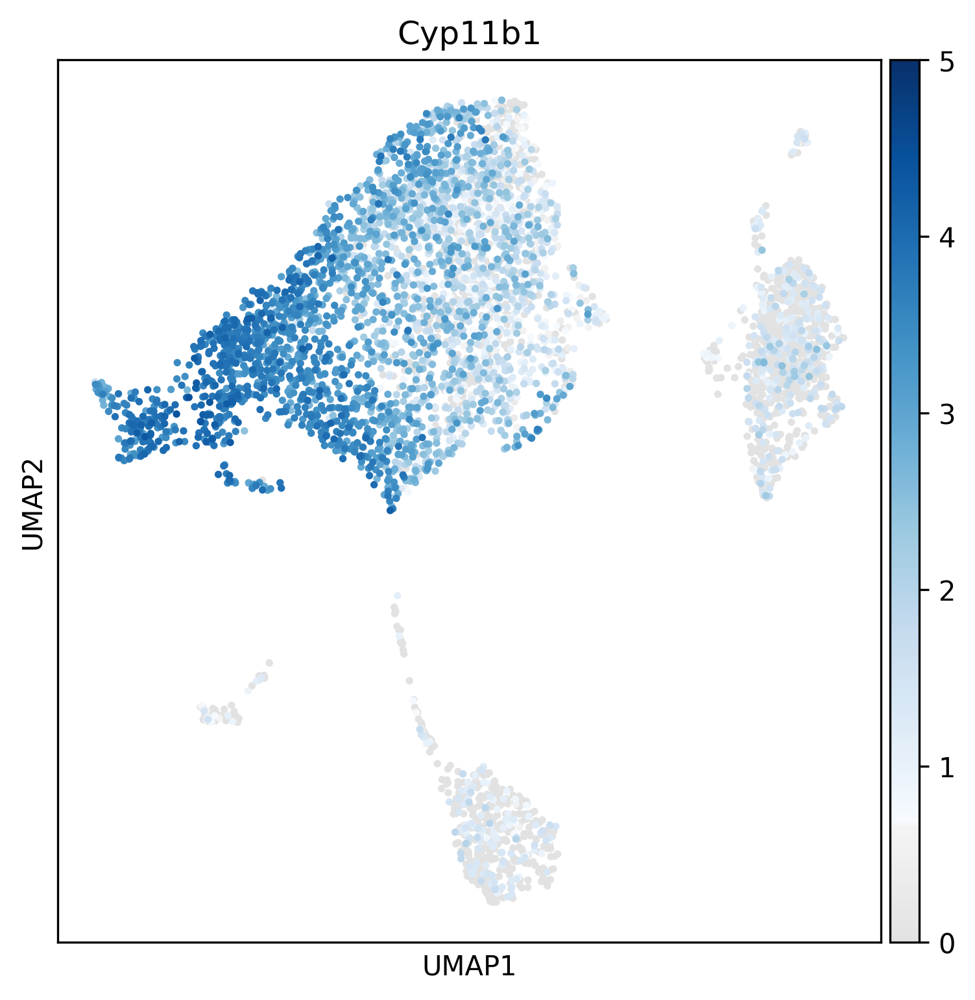

In [8]:
for gene in extra_genes:
    if gene in adata.var.index:
        sc.pl.umap(adata, color=gene, save='_adrenal_' + gene + '.png', color_map=mymap, size=30, vmax=5)

# Compositional Analysis

In [13]:
plt.rcParams['figure.figsize'] = (8, 8)
plt.rcParams['figure.dpi'] = 100

In [6]:
sc.tl.embedding_density(adata, basis='umap', groupby='condition')

computing density on 'umap'
--> added
    'umap_density_condition', densities (adata.obs)
    'umap_density_condition_params', parameter (adata.uns)


Stress     2727
Control    2151
Name: condition, dtype: int64


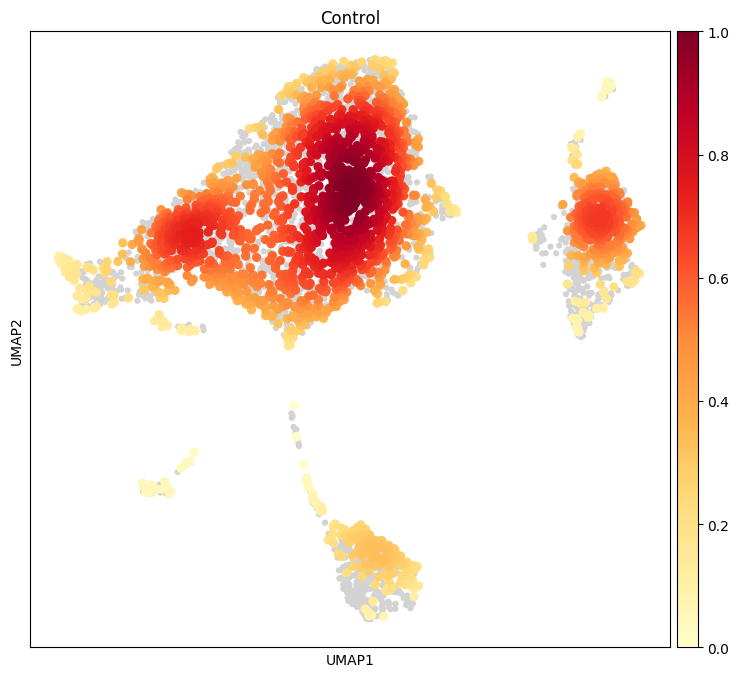

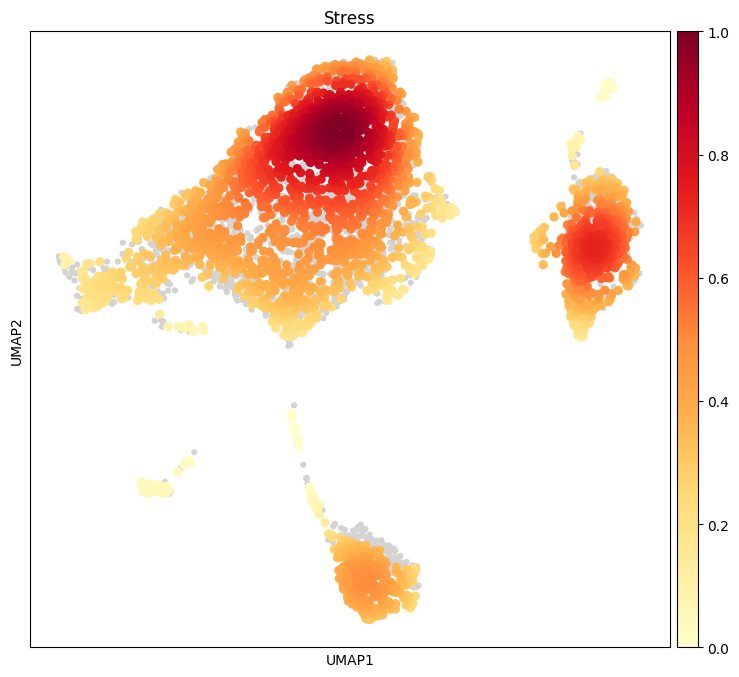

In [50]:
print(adata.obs['condition'].value_counts())
sc.pl.embedding_density(adata, basis='umap', key='umap_density_condition', group='Control', save='adrenal_control.png')
sc.pl.embedding_density(adata, basis='umap', key='umap_density_condition', group='Stress', save='adrenal_stress.png')


# Trajectory

In [14]:
#Subsetting to relevant clusters
clusters_to_include = [g for g in adata.obs['louvain_r1'].cat.categories if (g.startswith('Fasciculata') \
                                                                             or g.startswith('Glomerulosa') \
                                                                             or g.startswith('Transition') \
                                                                             or g.startswith('Cycling'))]
adata_sub = adata[np.isin(adata.obs['louvain_r1'], clusters_to_include),:].copy()

#Subset to highly variable genes
sc.pp.highly_variable_genes(adata_sub, flavor='cell_ranger', n_top_genes=4000, subset=True)

extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


computing PCA with n_comps = 50
computing PCA on highly variable genes
    finished (0:00:01)


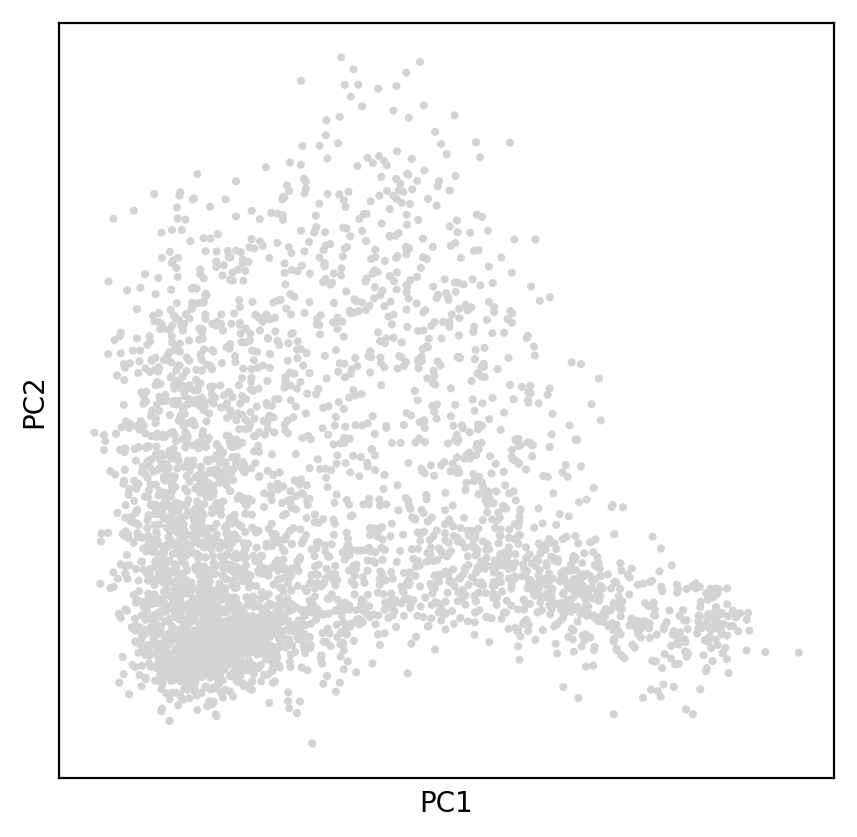

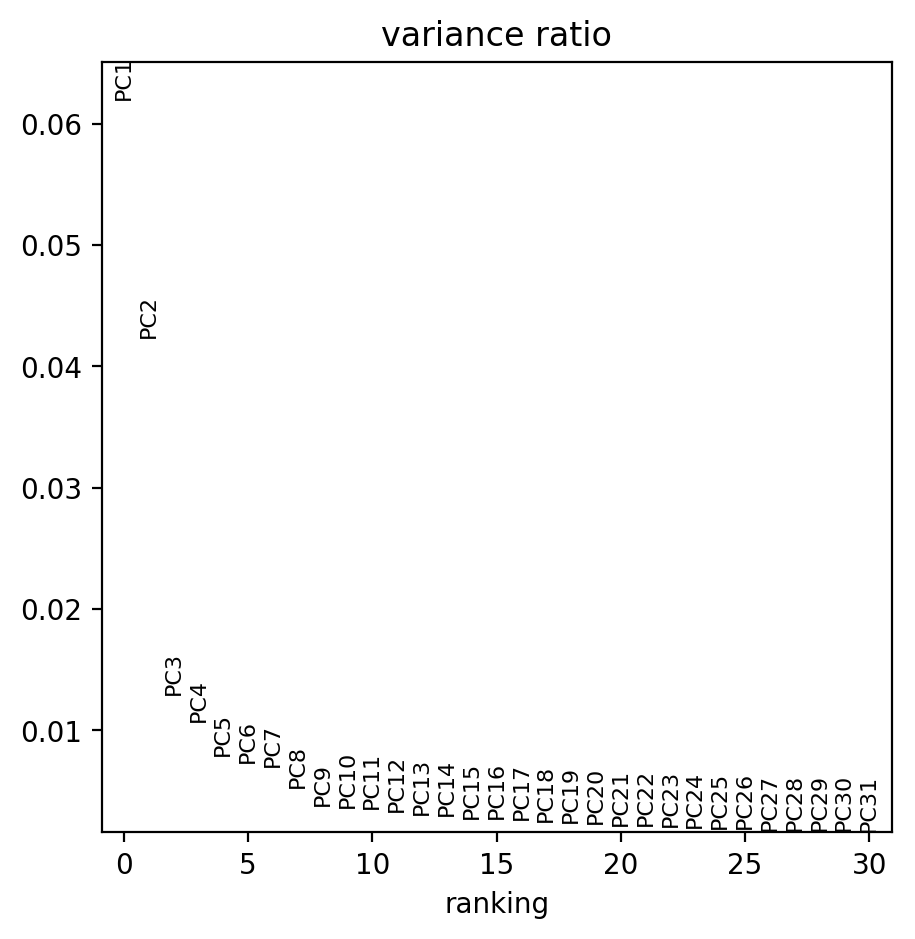

In [15]:
#Recalculating PCA for subset
sc.pp.pca(adata_sub, svd_solver='arpack')
sc.pl.pca(adata_sub)
sc.pl.pca_variance_ratio(adata_sub)

In [16]:
adata_sub.obsm['X_pca'] = adata_sub.obsm['X_pca'][:,0:5]

[1] "1:"
class: SlingshotDataSet 

 Samples Dimensions
    3511          2

lineages: 8 
Lineage1: Glomerulosa 2  Glomerulosa 1  Fasciculata 5  Fasciculata 2  Fasciculata 3  Fasciculata 1  
Lineage2: Glomerulosa 1  Fasciculata 5  Fasciculata 2  Fasciculata 3  Fasciculata 1  
Lineage3: Glomerulosa 2  Glomerulosa 1  Fasciculata 5  Fasciculata 4  
Lineage4: Glomerulosa 1  Glomerulosa 2  Transition 1  Transition 2  
Lineage5: Glomerulosa 2  Transition 1  Transition 2  
Lineage6: Glomerulosa 1  Glomerulosa 2  Cycling  
Lineage7: Glomerulosa 1  Fasciculata 5  Fasciculata 4  
Lineage8: Glomerulosa 2  Cycling  

curves: 8 
Curve1: Length: 19.887	Samples: 1558.94
Curve2: Length: 19.603	Samples: 1536.46
Curve3: Length: 15.839	Samples: 988.51
Curve4: Length: 12.836	Samples: 1227.32
Curve5: Length: 13.476	Samples: 1414.93
Curve6: Length: 12.545	Samples: 848.83
Curve7: Length: 15.812	Samples: 961.51
Curve8: Length: 12.749	Samples: 790.15
[1] ""
[1] "2:"
class: SlingshotDataSet 

 Samples Dimensions

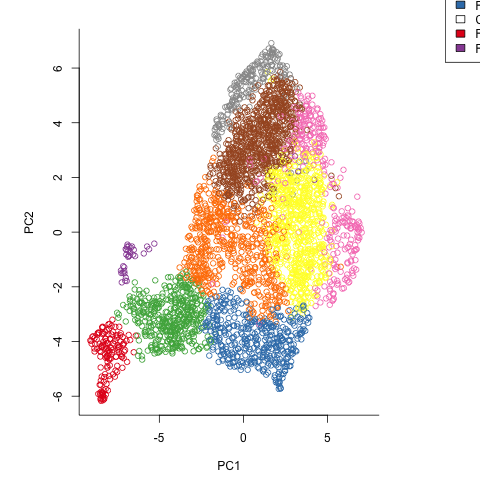

In [59]:
%%R -i adata_sub

#Plot 1
colour_map = brewer.pal(20,'Set1')
par(xpd=TRUE)
par(mar=c(4.5,5.5,2,7))
plot(reducedDims(adata_sub)$UMAP[,1], reducedDims(adata_sub)$UMAP[,2], col=colour_map[colData(adata_sub)$louvain_r1], bty='L', xlab='PC1', ylab='PC2')
legend(x=12, y=12, legend=unique(colData(adata_sub)$louvain_r1), fill=colour_map[as.integer(unique(colData(adata_sub)$louvain_r1))])

print("1:")
adata_sub_start <- slingshot(adata_sub, clusterLabels = 'louvain_r1', reducedDim = 'UMAP', start.clus=c('Glomerulosa 2', 'Glomerulosa 1'))
print(SlingshotDataSet(adata_sub_start))

print("")
print("2:")
adata_sub_startend <- slingshot(adata_sub, clusterLabels = 'louvain_r1', reducedDim = 'UMAP', start.clus=c('Glomerulosa 2', 'Glomerulosa 1'), end.clus='Fasciculata 1')
print(SlingshotDataSet(adata_sub_startend))

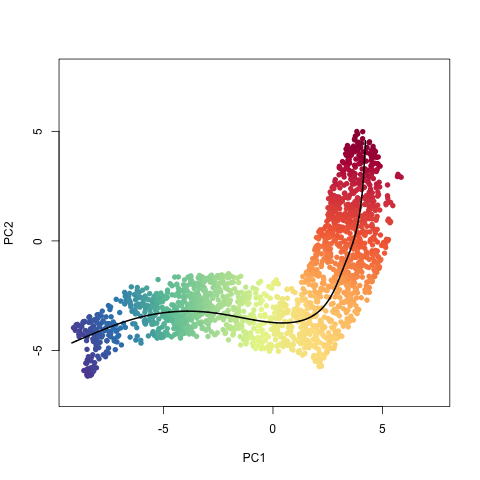

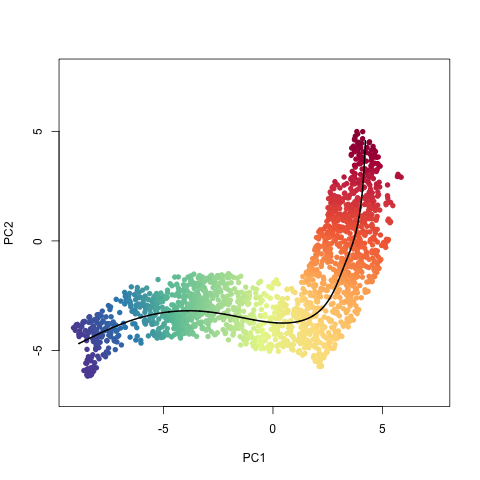

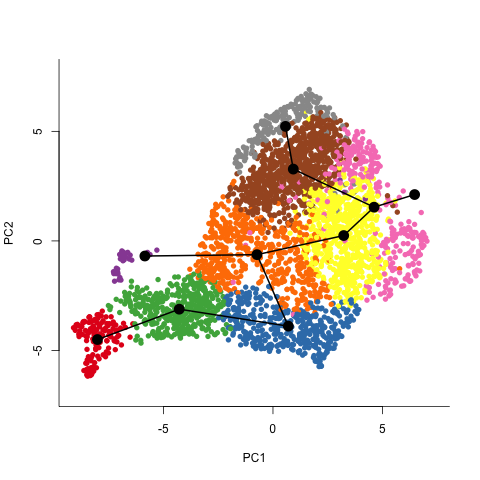

In [60]:
%%R -i adata_sub

#Plot of lineage 1
colors <- colorRampPalette(brewer.pal(11,'Spectral')[-6])(100)
plot(reducedDims(adata_sub_startend)$UMAP[,c(1,2)], col = colors[cut(adata_sub_startend$slingPseudotime_1,breaks=100)], pch=16, asp = 1, xlab='PC1', ylab='PC2')
lines(slingCurves(adata_sub_startend)$curve1, lwd=2)

#Plot of lineage 2
colors <- colorRampPalette(brewer.pal(11,'Spectral')[-6])(100)
plot(reducedDims(adata_sub_startend)$UMAP[,c(1,2)], col = colors[cut(adata_sub_startend$slingPseudotime_2,breaks=100)], pch=16, asp = 1, xlab='PC1', ylab='PC2')
lines(slingCurves(adata_sub_startend)$curve2, lwd=2)

#Plot of lineages with clusters visualized
par(xpd=TRUE)
plot(reducedDims(adata_sub_startend)$UMAP[,c(1,2)], col = brewer.pal(11,'Set1')[adata_sub$louvain_r1], pch=16, asp = 1, bty='L', xlab='PC1', ylab='PC2')
lines(SlingshotDataSet(adata_sub_startend), lwd=2, type='lineages')
legend(x=10, y=20, legend=unique(colData(adata_sub)$louvain_r1), fill=brewer.pal(11,'Set1')[as.integer(unique(colData(adata_sub)$louvain_r1))])

# Trajectory (control)

In [61]:
#Subsetting to relevant clusters
clusters_to_include = [g for g in adata.obs['louvain_r1'].cat.categories if (g.startswith('Fasciculata') \
                                                                             or g.startswith('Glomerulosa') \
                                                                             or g.startswith('Transition') \
                                                                             or g.startswith('Cycling'))]
adata_sub = adata[np.isin(adata.obs['louvain_r1'], clusters_to_include),:].copy()
adata_sub_ctrl = adata_sub[adata_sub.obs['condition']=='Control']
adata_sub_stress = adata_sub[adata_sub.obs['condition']=='Stress']
#Subset to highly variable genes
sc.pp.highly_variable_genes(adata_sub_ctrl, flavor='cell_ranger', n_top_genes=4000, subset=True)
sc.pp.highly_variable_genes(adata_sub_stress, flavor='cell_ranger', n_top_genes=4000, subset=True)

extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


Trying to set attribute `.var` of view, making a copy.


extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


Trying to set attribute `.var` of view, making a copy.


computing PCA with n_comps = 50
computing PCA on highly variable genes
    finished (0:00:00)


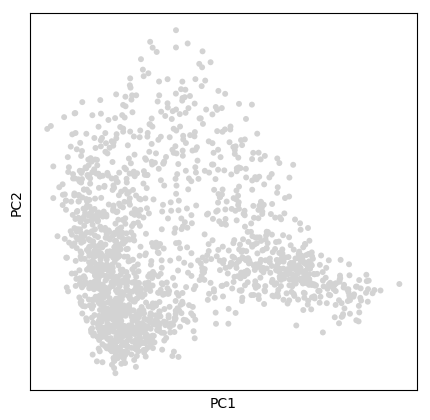

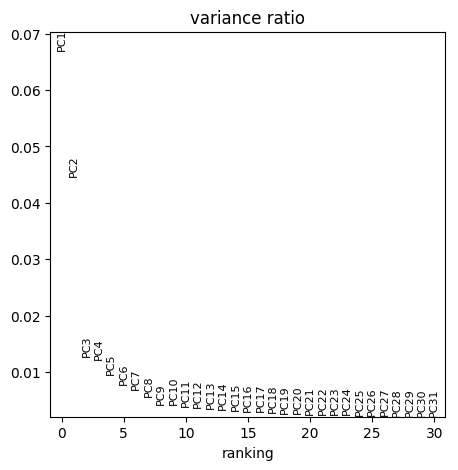

computing PCA with n_comps = 50
computing PCA on highly variable genes
    finished (0:00:00)


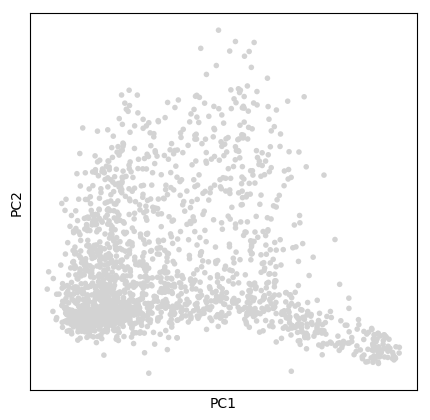

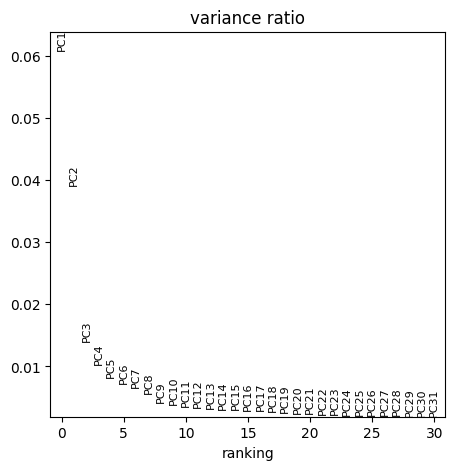

In [62]:
plt.rcParams['figure.figsize'] = (5, 5)
plt.rcParams['figure.dpi'] = 100
#Recalculating PCA for subset
sc.pp.pca(adata_sub_ctrl, svd_solver='arpack')
sc.pl.pca(adata_sub_ctrl)
sc.pl.pca_variance_ratio(adata_sub_ctrl)

#Recalculating PCA for subset
sc.pp.pca(adata_sub_stress, svd_solver='arpack')
sc.pl.pca(adata_sub_stress)
sc.pl.pca_variance_ratio(adata_sub_stress)

In [63]:
adata_sub_ctrl.obsm['X_pca'] = adata_sub_ctrl.obsm['X_pca'][:,0:9]
adata_sub_stress.obsm['X_pca'] = adata_sub_stress.obsm['X_pca'][:,0:9]

In [64]:
sc.tl.umap(adata_sub_ctrl)
sc.tl.umap(adata_sub_stress)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


[1] "1:"
class: SlingshotDataSet 

 Samples Dimensions
    1643          2

lineages: 5 
Lineage1: Glomerulosa 2  Glomerulosa 1  Fasciculata 5  Fasciculata 3  Fasciculata 1  
Lineage2: Glomerulosa 2  Glomerulosa 1  Fasciculata 5  Fasciculata 3  Fasciculata 4  
Lineage3: Glomerulosa 2  Glomerulosa 1  Fasciculata 5  Fasciculata 2  
Lineage4: Glomerulosa 2  Glomerulosa 1  Fasciculata 5  Cycling  
Lineage5: Glomerulosa 2  Transition 2  Transition 1  

curves: 5 
Curve1: Length: 19.249	Samples: 839.66
Curve2: Length: 16.786	Samples: 808.29
Curve3: Length: 17.126	Samples: 843.04
Curve4: Length: 18.107	Samples: 599.77
Curve5: Length: 14.713	Samples: 808.76
[1] ""
[1] "2:"
class: SlingshotDataSet 

 Samples Dimensions
    1643          2

lineages: 5 
Lineage1: Glomerulosa 2  Glomerulosa 1  Fasciculata 5  Fasciculata 3  Fasciculata 1  
Lineage2: Glomerulosa 2  Glomerulosa 1  Fasciculata 5  Fasciculata 3  Fasciculata 4  
Lineage3: Glomerulosa 2  Glomerulosa 1  Fasciculata 5  Fasciculata 2  
Lin

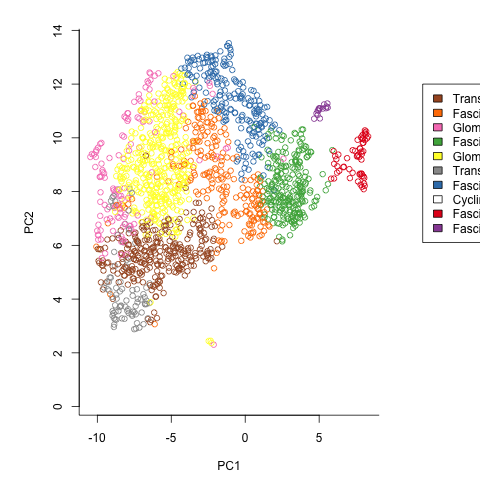

In [71]:
%%R -i adata_sub_ctrl

#Plot 1
colour_map = brewer.pal(20,'Set1')
par(xpd=TRUE)
par(mar=c(4.5,5.5,2,7))
plot(reducedDims(adata_sub_ctrl)$UMAP[,1], reducedDims(adata_sub_ctrl)$UMAP[,2], col=colour_map[colData(adata_sub_ctrl)$louvain_r1], bty='L', xlab='PC1', ylab='PC2')
legend(x=12, y=12, legend=unique(colData(adata_sub_ctrl)$louvain_r1), fill=colour_map[as.integer(unique(colData(adata_sub_ctrl)$louvain_r1))])

print("1:")
adata_sub_ctrl_start <- slingshot(adata_sub_ctrl, clusterLabels = 'louvain_r1', reducedDim = 'UMAP', start.clus=c('Glomerulosa 2'))
print(SlingshotDataSet(adata_sub_ctrl_start))

print("")
print("2:")
adata_sub_ctrl_startend <- slingshot(adata_sub_ctrl, clusterLabels = 'louvain_r1', reducedDim = 'UMAP', start.clus=c('Glomerulosa 2'), end.clus='Fasciculata 1')
print(SlingshotDataSet(adata_sub_ctrl_startend))

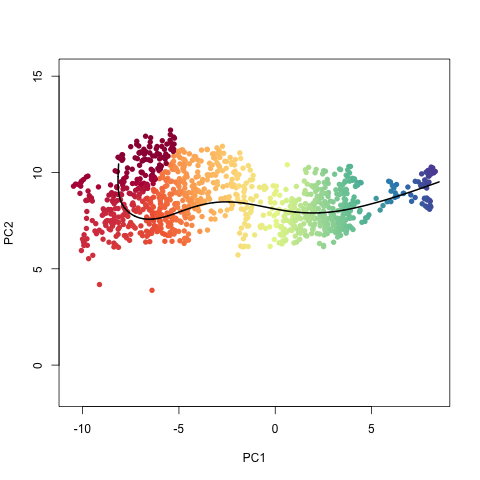

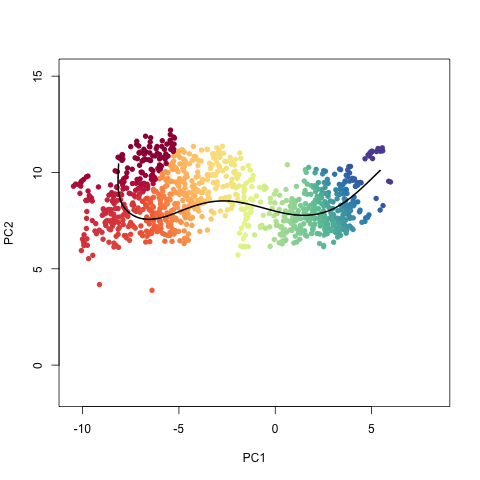

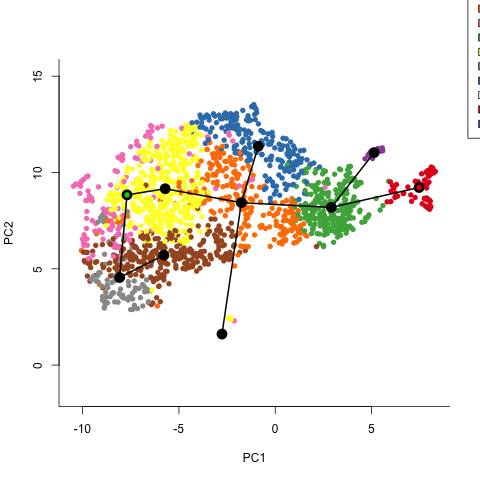

In [77]:
%%R

#Plot of lineage 1
colors <- colorRampPalette(brewer.pal(11,'Spectral')[-6])(100)
plot(reducedDims(adata_sub_ctrl_startend)$UMAP[,c(1,2)], col = colors[cut(adata_sub_ctrl_startend$slingPseudotime_1,breaks=100)], pch=16, asp = 1, xlab='PC1', ylab='PC2')
lines(slingCurves(adata_sub_ctrl_startend)$curve1, lwd=2, show.constraints=TRUE)

#Plot of lineage 2
colors <- colorRampPalette(brewer.pal(11,'Spectral')[-6])(100)
plot(reducedDims(adata_sub_ctrl_startend)$UMAP[,c(1,2)], col = colors[cut(adata_sub_ctrl_startend$slingPseudotime_2,breaks=100)], pch=16, asp = 1, xlab='PC1', ylab='PC2')
lines(slingCurves(adata_sub_ctrl_startend)$curve2, lwd=2, show.constraints=TRUE)

#Plot of lineages with clusters visualized
par(xpd=TRUE)
plot(reducedDims(adata_sub_ctrl_startend)$UMAP[,c(1,2)], col = brewer.pal(11,'Set1')[adata_sub_ctrl$louvain_r1], pch=16, asp = 1, bty='L', xlab='PC1', ylab='PC2')
lines(SlingshotDataSet(adata_sub_ctrl_startend), lwd=2, type='lineages', show.constraints=TRUE)
legend(x=10, y=20, legend=unique(colData(adata_sub_ctrl)$louvain_r1), fill=brewer.pal(11,'Set1')[as.integer(unique(colData(adata_sub_ctrl)$louvain_r1))])

[1] "1:"
class: SlingshotDataSet 

 Samples Dimensions
    1868          2

lineages: 5 
Lineage1: Glomerulosa 2  Transition 1  Cycling  Transition 2  
Lineage2: Glomerulosa 2  Fasciculata 5  Fasciculata 3  Fasciculata 1  
Lineage3: Glomerulosa 2  Fasciculata 5  Fasciculata 4  
Lineage4: Glomerulosa 2  Glomerulosa 1  
Lineage5: Glomerulosa 2  Fasciculata 2  

curves: 5 
Curve1: Length: 14.227	Samples: 720.21
Curve2: Length: 17.913	Samples: 650.75
Curve3: Length: 16.232	Samples: 470.45
Curve4: Length: 10.826	Samples: 423.59
Curve5: Length: 13.018	Samples: 544.43
[1] ""
[1] "2:"
class: SlingshotDataSet 

 Samples Dimensions
    1868          2

lineages: 5 
Lineage1: Glomerulosa 2  Transition 1  Cycling  Transition 2  
Lineage2: Glomerulosa 2  Fasciculata 5  Fasciculata 3  Fasciculata 1  
Lineage3: Glomerulosa 2  Fasciculata 5  Fasciculata 4  
Lineage4: Glomerulosa 2  Glomerulosa 1  
Lineage5: Glomerulosa 2  Fasciculata 2  

curves: 5 
Curve1: Length: 14.227	Samples: 720.21
Curve2: Lengt

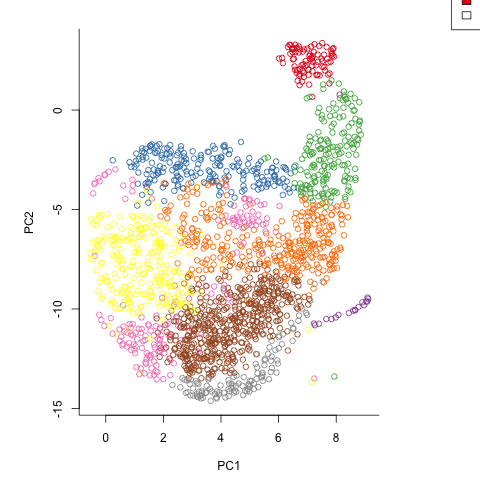

In [69]:
%%R -i adata_sub_stress

#Plot 1
colour_map = brewer.pal(20,'Set1')
par(xpd=TRUE)
par(mar=c(4.5,5.5,2,7))
plot(reducedDims(adata_sub_stress)$UMAP[,1], reducedDims(adata_sub_stress)$UMAP[,2], col=colour_map[colData(adata_sub_stress)$louvain_r1], bty='L', xlab='PC1', ylab='PC2')
legend(x=12, y=12, legend=unique(colData(adata_sub_stress)$louvain_r1), fill=colour_map[as.integer(unique(colData(adata_sub_stress)$louvain_r1))])

print("1:")
adata_sub_stress_start <- slingshot(adata_sub_stress, clusterLabels = 'louvain_r1', reducedDim = 'UMAP', start.clus=c('Glomerulosa 2'))
print(SlingshotDataSet(adata_sub_stress_start))

print("")
print("2:")
adata_sub_stress_startend <- slingshot(adata_sub_stress, clusterLabels = 'louvain_r1', reducedDim = 'UMAP', start.clus=c('Glomerulosa 2'), end.clus='Fasciculata 1')
print(SlingshotDataSet(adata_sub_stress_startend))

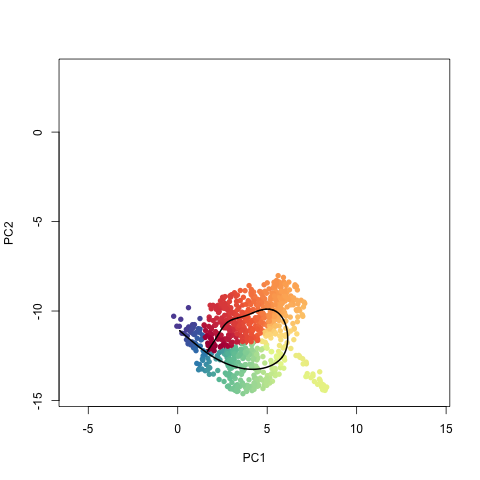

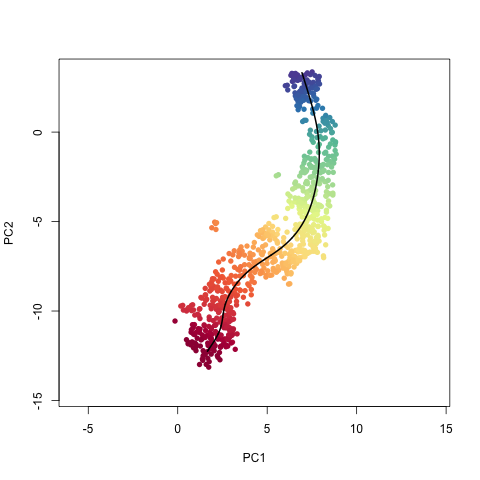

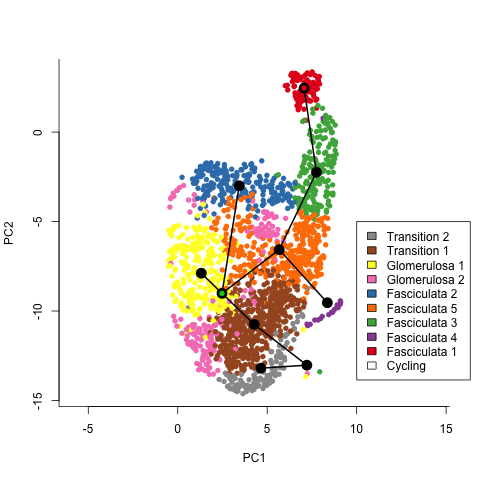

In [78]:
%%R

#Plot of lineage 1
colors <- colorRampPalette(brewer.pal(11,'Spectral')[-6])(100)
plot(reducedDims(adata_sub_stress_startend)$UMAP[,c(1,2)], col = colors[cut(adata_sub_stress_startend$slingPseudotime_1,breaks=100)], pch=16, asp = 1, xlab='PC1', ylab='PC2')
lines(slingCurves(adata_sub_stress_startend)$curve1, lwd=2)

#Plot of lineage 2
colors <- colorRampPalette(brewer.pal(11,'Spectral')[-6])(100)
plot(reducedDims(adata_sub_stress_startend)$UMAP[,c(1,2)], col = colors[cut(adata_sub_stress_startend$slingPseudotime_2,breaks=100)], pch=16, asp = 1, xlab='PC1', ylab='PC2')
lines(slingCurves(adata_sub_stress_startend)$curve2, lwd=2)

#Plot of lineages with clusters visualized
par(xpd=TRUE)
plot(reducedDims(adata_sub_stress_startend)$UMAP[,c(1,2)], col = brewer.pal(11,'Set1')[adata_sub_stress$louvain_r1], pch=16, asp = 1, bty='L', xlab='PC1', ylab='PC2')
lines(SlingshotDataSet(adata_sub_stress_startend), lwd=2, type='lineages', show.constraints=TRUE)
legend(x=10, y=-5, legend=unique(colData(adata_sub_stress)$louvain_r1), fill=brewer.pal(11,'Set1')[as.integer(unique(colData(adata_sub_stress)$louvain_r1))])

In [30]:
#Preprocessing for monocle
data_mat_mon = adata.layers['counts'].T
var_mon=adata.var.copy()
obs_mon=adata.obs.copy()

In [38]:
%%R -i data_mat_mon -i obs_mon -i var_mon

#Set up the CellDataSet data structure
pd <- AnnotatedDataFrame(data = obs_mon)
fd <- AnnotatedDataFrame(data = var_mon)
colnames(data_mat_mon) <- rownames(pd)
rownames(data_mat_mon) <- rownames(fd)
ie_regions_cds <- newCellDataSet(cellData=data_mat_mon, phenoData=pd, featureData=fd, expressionFamily=negbinomial.size())

#Normalize the count data
ie_regions_cds <- estimateSizeFactors(ie_regions_cds)

#Calculate dispersions to filter for highly variable genes
ie_regions_cds <- estimateDispersions(ie_regions_cds)


#Filter for Stem, EP, TA, and Enterocytes
cell_types = as.character(pData(ie_regions_cds)$louvain_r1)
cell_mask = rep(FALSE, length(cell_types))
cells_to_keep = c("Fasciculata", "Glomerulosa", "Cycling", "Transition")
for (item in cells_to_keep) {cell_mask = cell_mask | startsWith(cell_types, item)}
print("Number of cells after filtering:")
print(sum(cell_mask))
print("")

#Filter highly variable genes from our analysis
hvg_mask = fData(ie_regions_cds)$highly_variable
ie_regions_cds <- ie_regions_cds[hvg_mask, cell_mask]

#Do dimensionality reduction
ie_regions_cds <- reduceDimension(ie_regions_cds, norm_method = 'vstExprs', reduction_method='DDRTree', verbose = F, max_components = 7)

#Run for the first time to get the ordering
ie_regions_cds <- orderCells(ie_regions_cds)

#Find the correct root state the corresponds to the 'Stem' cluster
tab1 <- table(pData(ie_regions_cds)$State, pData(ie_regions_cds)$louvain_r1)
id = which(colnames(tab1) == 'Fasciculata 1')
root_name = names(which.max(tab1[,id]))

#Run a second time to get the correct root state that overlaps with Stem cells
ie_regions_cds <- orderCells(ie_regions_cds, root_state=root_name)

[1] "Number of cells after filtering:"
[1] 3511
[1] ""


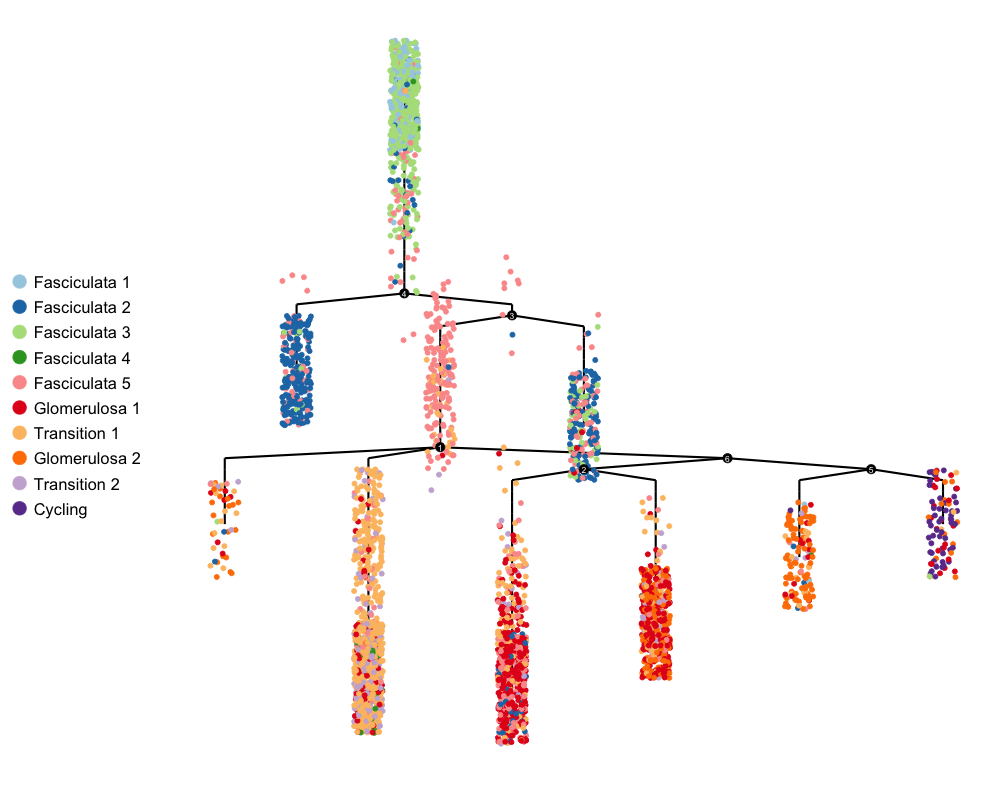

In [39]:
%%R -w 1000 -h 800

#Get a nice colour map
custom_colour_map = brewer.pal(length(unique(pData(ie_regions_cds)$louvain_r1)),'Paired')

#Find the correct root state that coresponds to the 'Stem' cluster
tab1 <- table(pData(ie_regions_cds)$State, pData(ie_regions_cds)$louvain_r1)
id = which(colnames(tab1) == 'Fasciculata 1')
root_name = names(which.max(tab1[,id]))

# Visualize with our cluster labels
options(repr.plot.width=5, repr.plot.height=4)
plot_complex_cell_trajectory(ie_regions_cds, color_by = 'louvain_r1', show_branch_points = T, 
                             cell_size = 2, cell_link_size = 1, root_states = c(root_name)) +
scale_size(range = c(0.2, 0.2)) +
theme(legend.position="left", legend.title=element_blank(), legend.text=element_text(size=rel(1.5))) +
guides(colour = guide_legend(override.aes = list(size=6))) + 
scale_color_manual(values = custom_colour_map)

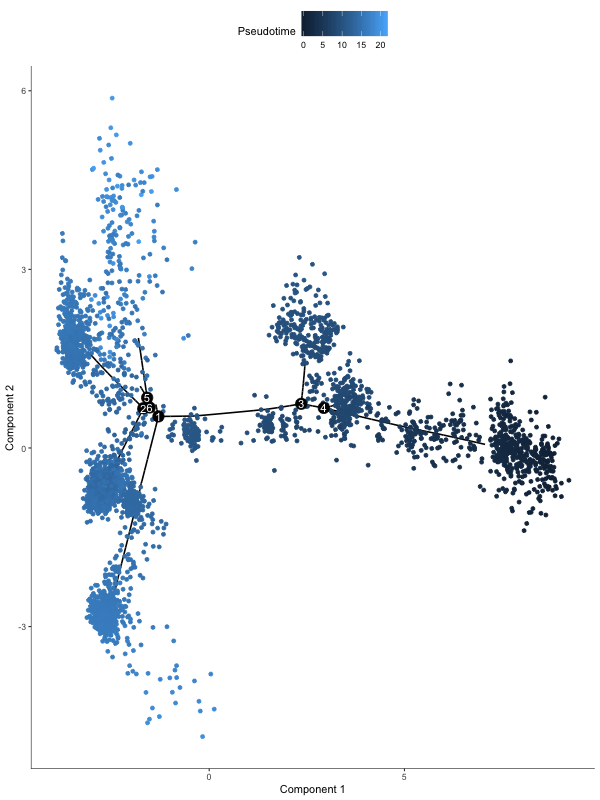

In [40]:
%%R -w 600 -h 800

#Visualize pseudotime found
options(repr.plot.width=5, repr.plot.height=4)
plot_cell_trajectory(ie_regions_cds, color_by="Pseudotime")

In [40]:
sc.pp.neighbors(adata_sub)
sc.pp.neighbors(adata_sub_ctrl)
sc.pp.neighbors(adata_sub_stress)
sc.tl.diffmap(adata_sub)
sc.tl.diffmap(adata_sub_ctrl)
sc.tl.diffmap(adata_sub_stress)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:02)
computing neighbors
    using 'X_pca' with n_pcs = 9
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 9
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9893084  0.9778221  0.9693676  0.95588094 0.9489206
     0.9412595  0.936889   0.9295899  0.927259   0.9061322  0.9037433
     0.898805   0.88900745 0.8780918 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.

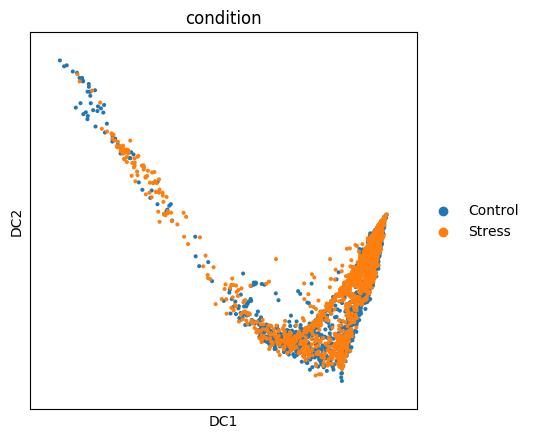

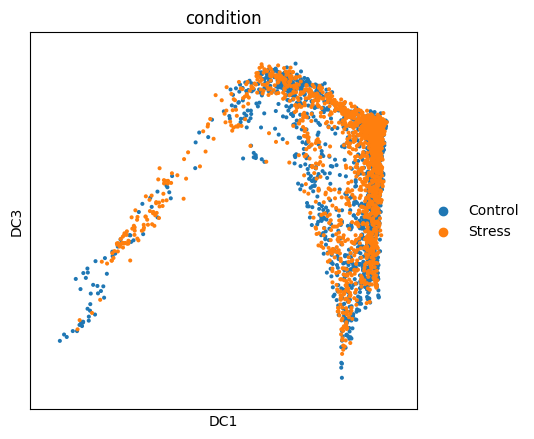

In [43]:
sc.pl.diffmap(adata_sub, components='1,2', color='condition')
sc.pl.diffmap(adata_sub, components='1,3', color='condition')

In [45]:
sc.tl.paga(adata_sub, groups='louvain_r1')

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)


--> added 'pos', the PAGA positions (adata.uns['paga'])


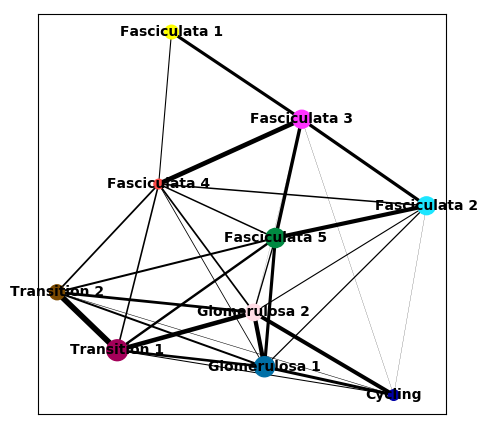

In [46]:
sc.pl.paga(adata_sub)

--> added 'pos', the PAGA positions (adata.uns['paga'])


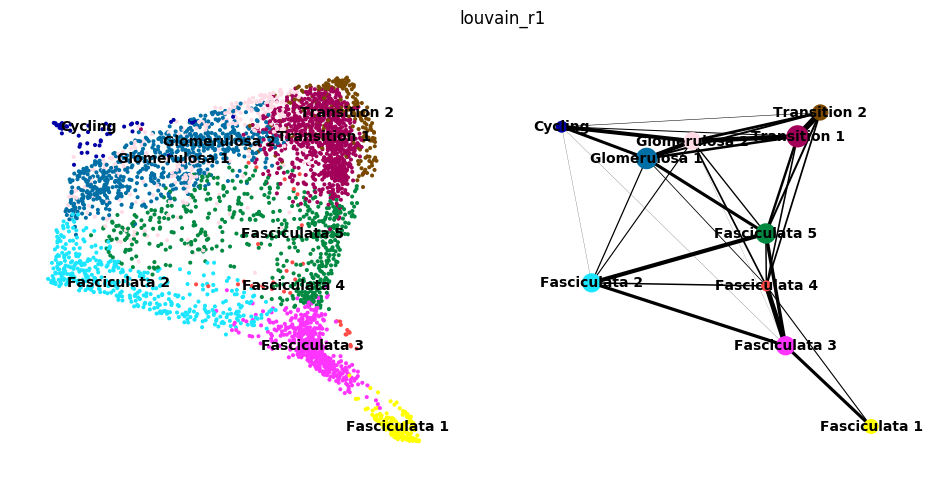

In [49]:
sc.pl.paga_compare(adata_sub)

In [51]:
sc.tl.umap(adata_sub)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:06)


--> added 'pos', the PAGA positions (adata.uns['paga'])


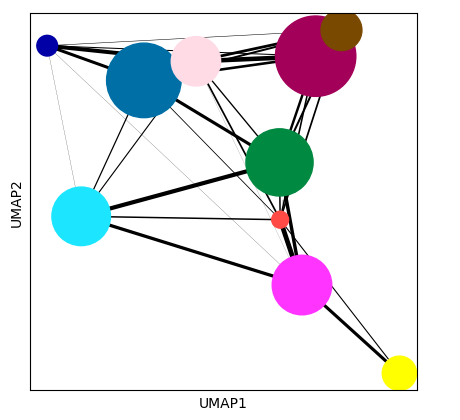

In [57]:
fig1, ax1 = plt.subplots()
sc.pl.umap(adata_sub, size=40, ax=ax1, show=False)
sc.pl.paga(adata_sub, pos=adata_sub.uns['paga']['pos'], show=False, node_size_scale=10, node_size_power=1, ax=ax1, text_kwds={'alpha':0})
#plt.savefig('./figures/umap_paga_overlay_gut.pdf', dpi=300, format='pdf')
plt.show()

In [28]:
adata.obs['louvain_r1'].cat.categories

Index(['Fasciculata 1', 'Fasciculata 2', 'Fasciculata 3', 'Fasciculata 4',
       'Fasciculata 5', 'Glomerulosa 1', 'Transition 1', 'Glomerulosa 2',
       'Transition 2', 'Cycling', 'Capsular Cells', 'Medulla', 'Macrophages 1',
       'Macrophages 2', 'Endothelial', 'Blood Cells'],
      dtype='object')

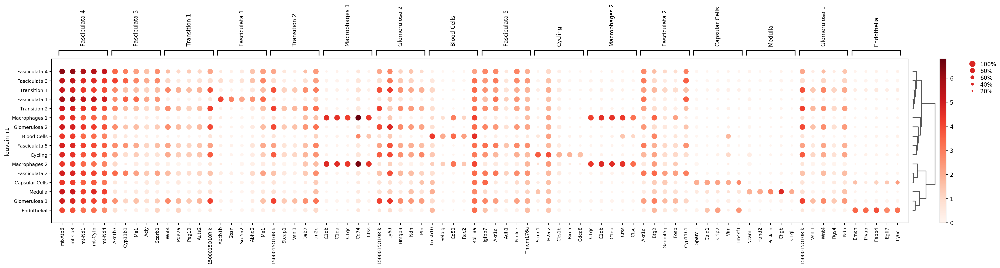

In [11]:
sc.pl.stacked_violinplot(adata, n_genes=5, key='rank_genes_r1', use_raw=False)

In [41]:
df = pd.read_csv('../data/pablo.tsv', sep='\t')

In [53]:
df

,Gene Name,Abcb1b,Abcb1a
0,Adrenal Gland,1340.0,0.7
1,Ovary,219.0,0.4
2,Aorta,36.0,0.3
3,Axillary lymph node,23.0,0.3
4,Tongue,17.0,0.0
5,Uterus,15.0,0.3
6,Skin,15.0,0.0
7,Bone (os femoris),10.0,0.0
8,Urinary Bladder,9.0,0.2
9,Lung,8.0,0.1


In [54]:
df = df.set_index('Gene Name')

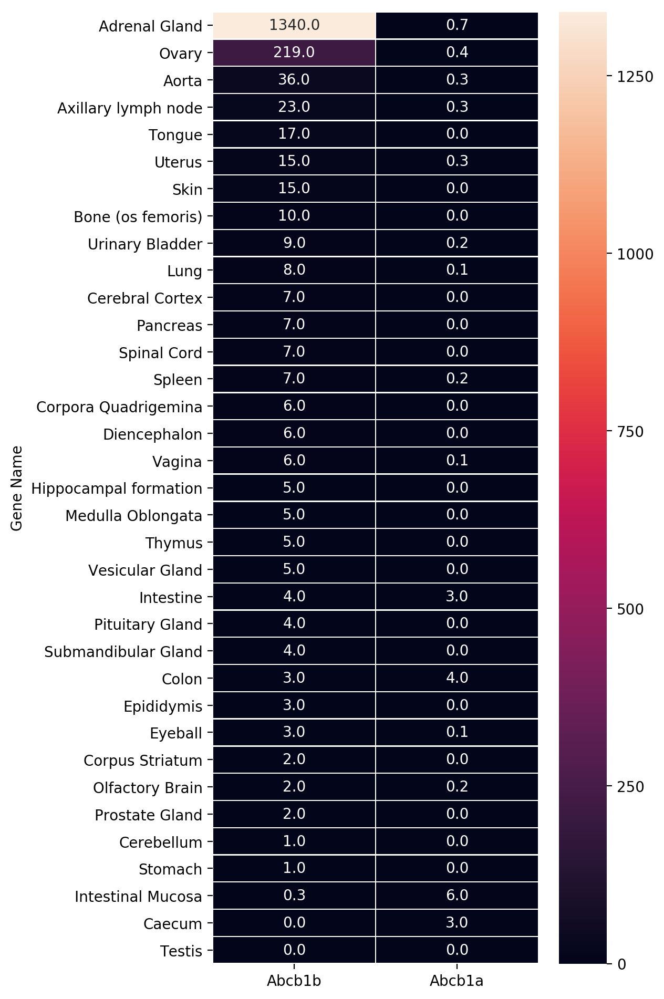

In [71]:
plt.rcParams['figure.figsize'] = (5, 12)
sns.heatmap(df, annot=True, fmt='.1f', linewidths=0.5)